In [1]:
# !pip install --upgrade google-api-python-client google-auth-httplib2 google-auth-oauthlib

In [2]:
# from google.colab import auth

# PROJECT_ID = "ee-mlglobalhealth"  # @param {type:"string"}

# auth.authenticate_user(project_id=PROJECT_ID)

In [3]:
# from google.colab import drive
# drive.mount('/content/gdrive')
# %cd gdrive/My Drive/'Oxford Thesis'/my_code/aggVAE_colab
# !ls

In [4]:
#import jax

# print("JAX backend:", jax.lib.xla_bridge.get_backend().platform)
# print("CUDA available:", jax.devices("gpu"))

In [5]:
# !pip install pip==24.0
# !pip install dill==0.3.8
# !pip install shapely==2.0.3
# !pip install geopandas==0.14.3
# !pip install arviz==0.18.0
# !pip install numpyro==0.14.0
# !pip install jax==0.4.25
# !pip install jaxlib==0.4.25

In [6]:
# !pip install -U "jax[cuda12]"

In [7]:
# general libraries
import time
import math
import numpy as np
from shapely import geometry
from shapely.geometry import Polygon, Point
import matplotlib
import matplotlib.pyplot as plt
import pickle
import os
import geopandas as gpd
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
# import dill
import geopandas
import geopandas as gpd
import matplotlib.colors as colors
import wandb
from typing import Optional, Union
from pathlib import Path
import orbax.checkpoint
import dill
from scipy.stats import pearsonr, spearmanr
from sklearn.metrics import mean_squared_error, mean_absolute_error



# JAX
import jax
import jax.numpy as jnp

jax.config.update('jax_platform_name', 'gpu')  # Use GPU

from jax import random, lax, jit, ops
from jax.example_libraries import stax
# previously was "from jax.experimental import stax" due to previous versions of jax


# Numpyro
import numpyro
from numpyro.infer import SVI, MCMC, NUTS, init_to_median, Predictive, RenyiELBO
import numpyro.distributions as dist
from numpyro.diagnostics import hpdi
from numpyro import optim

print(jax.__version__)
print(numpyro.__version__)

0.4.31
0.14.0


## Read shape files

In [8]:
shape_new = gpd.read_file('data/Shapefiles/zmb_admbnda_adm1_dmmu_20201124.shp')
shape_new = shape_new[['ADM1_EN', 'geometry']]
shape_new['new'] = 1
shape_new.head(2)

,ADM1_EN,geometry,new
0,Central,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1
1,Copperbelt,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1


In [9]:
shape_old = gpd.read_file('data/Shapefiles/zmb_admbnda_adm2_dmmu_20201124.shp')
shape_old = shape_old[['ADM2_EN', 'geometry']]
shape_old['new'] = 0
shape_old.head(2)

,ADM2_EN,geometry,new
0,Chibombo,"POLYGON ((28.00409 -14.51361, 28.00989 -14.514...",0
1,Chisamba,"POLYGON ((28.65022 -14.38920, 28.65131 -14.389...",0


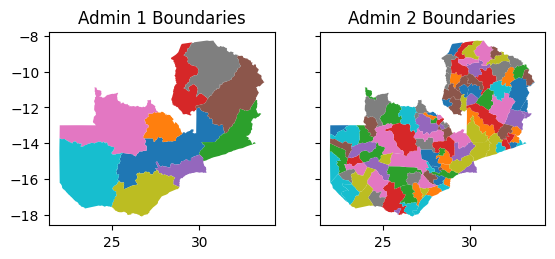

In [10]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, sharey=True)
shape_new.plot(ax=ax1, column='ADM1_EN')
shape_old.plot(ax=ax2, column='ADM2_EN')
ax1.set_title('Admin 1 Boundaries')
ax2.set_title('Admin 2 Boundaries')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig('figures/boundaries_all_admins.pdf')

<Axes: >

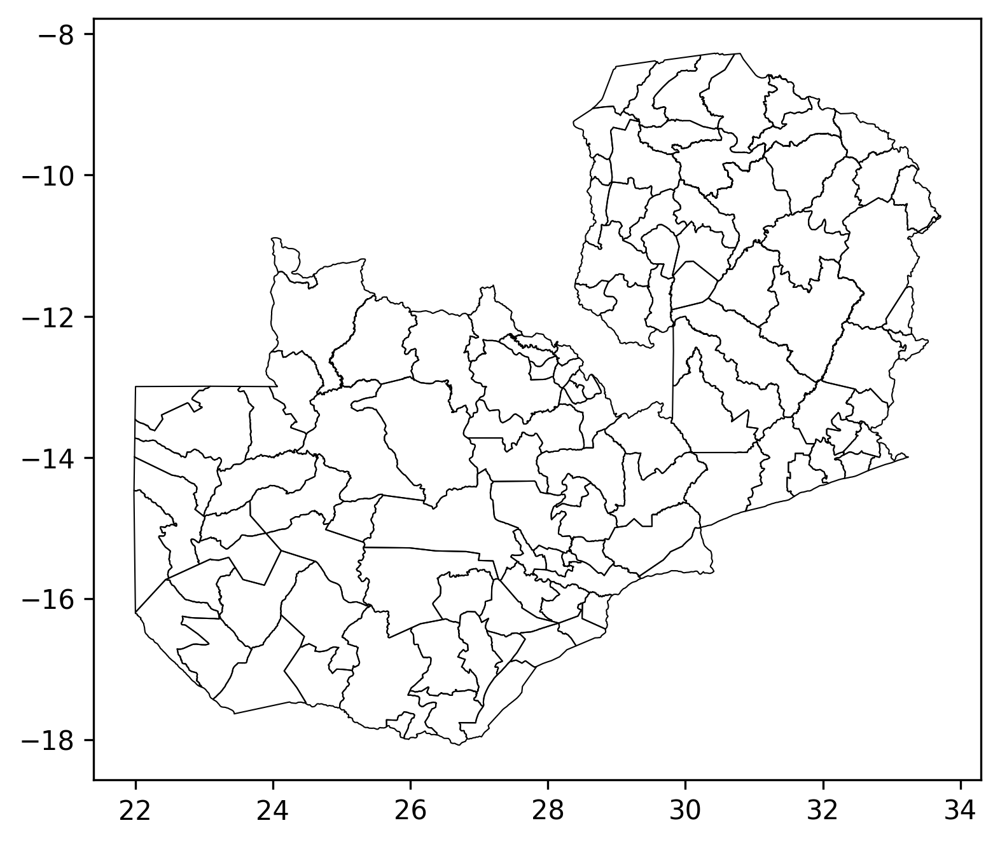

In [11]:
shape_old.boundary.plot(linewidth=0.5,  edgecolor='black', figsize=(6,6))
#plt.rcParams['figure.dpi'] = 300
#plt.rcParams['savefig.dpi'] = 300
#plt.savefig('res/boundaries_before2010.pdf')

<Axes: >

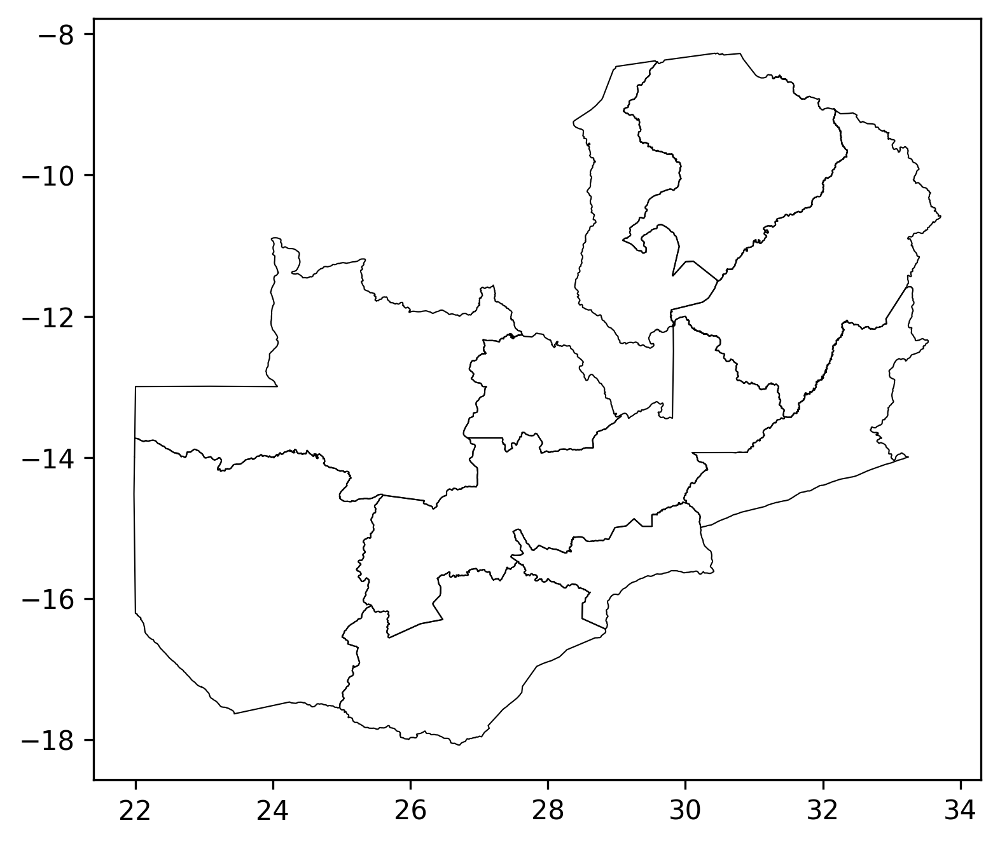

In [12]:
shape_new.boundary.plot(linewidth=0.5,  edgecolor='black', figsize=(6,6))
#plt.rcParams['figure.dpi'] = 300
#plt.rcParams['savefig.dpi'] = 300
#plt.savefig('res/boundaries_after2010.pdf')

In [13]:
# capitalise unit names
names_shape_new = shape_new['ADM1_EN'].values
shape_new['ADM1_EN'] =  np.array([names_shape_new[i].upper() for i in range(len(names_shape_new))])
shape_new.head(5)

,ADM1_EN,geometry,new
0,CENTRAL,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1
1,COPPERBELT,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1
2,EASTERN,"POLYGON ((33.25764 -11.58238, 33.26164 -11.585...",1
3,LUAPULA,"POLYGON ((29.37374 -8.70908, 29.36164 -8.72298...",1
4,LUSAKA,"POLYGON ((29.98254 -14.64278, 29.98494 -14.643...",1


In [14]:
names_shape_new = shape_new['ADM1_EN'].values
names_shape_new

array(['CENTRAL', 'COPPERBELT', 'EASTERN', 'LUAPULA', 'LUSAKA',
       'MUCHINGA', 'NORTH-WESTERN', 'NORTHERN', 'SOUTHERN', 'WESTERN'],
      dtype=object)

In [15]:
# capitalise unit names
names_shape_old = shape_old['ADM2_EN'].values
shape_old['ADM2_EN'] =  np.array([names_shape_old[i].upper() for i in range(len(names_shape_old))])
shape_old.head(5)

,ADM2_EN,geometry,new
0,CHIBOMBO,"POLYGON ((28.00409 -14.51361, 28.00989 -14.514...",0
1,CHISAMBA,"POLYGON ((28.65022 -14.38920, 28.65131 -14.389...",0
2,CHITAMBO,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",0
3,ITEZHI-TEZHI,"POLYGON ((26.99044 -15.46178, 27.20284 -15.468...",0
4,KABWE,"POLYGON ((28.33593 -14.26089, 28.33684 -14.262...",0


In [16]:
names_shape_old = shape_old['ADM2_EN'].values
names_shape_old

array(['CHIBOMBO', 'CHISAMBA', 'CHITAMBO', 'ITEZHI-TEZHI', 'KABWE',
       'LUANO', 'MKUSHI', 'MUMBWA', 'NGABWE', 'SERENJE', 'CHILILABOMBWE',
       'CHINGOLA', 'KALULUSHI', 'KITWE', 'LUANSHYA', 'LUFWANYAMA',
       'MASAITI', 'MPONGWE', 'MUFULIRA', 'NDOLA', 'CHADIZA', 'CHASEFU',
       'CHIPANGALI', 'CHIPATA', 'KASENENGWA', 'KATETE', 'LUMEZI',
       'LUNDAZI', 'MAMBWE', 'NYIMBA', 'PETAUKE', 'SINDA', 'VUBWI',
       'CHEMBE', 'CHIENGI', 'CHIFUNABULI', 'CHIPILI', 'KAWAMBWA', 'LUNGA',
       'MANSA', 'MILENGI', 'MWANSABOMBWE', 'MWENSE', 'SAMFYA', 'CHILANGA',
       'CHIRUNDU', 'CHONGWE', 'KAFUE', 'LUANGWA', 'LUSAKA', 'RUFUNSA',
       'SHIBUYUNJI', 'CHAMA', 'CHINSALI', 'ISOKA', 'KANCHIBIYA',
       'LAVUSHIMANDA', 'MAFINGA', 'MPIKA', 'NAKONDE', 'CHAVUMA',
       'IKELENGE', 'KABOMPO', 'KALUMBILA', 'KASEMPA', 'MANYINGA',
       'MUFUMBWE', 'MUSHINDANO', 'MWINILUNGA', 'SOLWEZI', 'ZAMBEZI',
       'CHILUBI', 'KAPUTA', 'KASAMA', 'LUNTE DISTRICT', 'LUPOSOSHI',
       'LUWINGU', 'MBALA', 'MPU

# Malaria data

In [17]:
infections_new = pd.read_csv("../../data/dhs/ZMB_prev_data_admin1.csv")
infections_new = infections_new[['unit', 'usage', 'num_rdt', 'num_rdt_positive', 'prev_estimate']]
infections_new = infections_new.rename({'unit': 'area'}, axis='columns')
infections_new = infections_new.sort_values(by=['area'])
infections_new.head(5)

,area,usage,num_rdt,num_rdt_positive,prev_estimate
3,Central,0.379661,2073.082241,105.938283,0.051102
1,Copperbelt,0.444083,3490.462209,420.221728,0.120391
0,Eastern,0.547537,3013.083502,194.763008,0.064639
6,Luapula,0.614999,1627.434474,89.950700,0.055271
9,Lusaka,0.222109,4881.258989,628.867127,0.128833


In [18]:
infections_old = pd.read_csv("../../data/dhs/ZMB_prev_data_admin2.csv")
infections_old.head(2)

,Unnamed: 0,unit,year,usage,num_rdt,num_rdt_positive,prev_estimate
0,1,Chadiza,2018,0.592593,43.522101,2.352546,0.054054
1,2,Chama,2018,0.656690,219.745559,13.109616,0.059658


In [19]:
infections_old = infections_old[['unit', 'usage', 'num_rdt', 'num_rdt_positive', 'prev_estimate']]
infections_old = infections_old.rename({'unit': 'area'}, axis='columns')
infections_old = infections_old.sort_values(by=['area'])
infections_old.head(2)

,area,usage,num_rdt,num_rdt_positive,prev_estimate
0,Chadiza,0.592593,43.522101,2.352546,0.054054
1,Chama,0.656690,219.745559,13.109616,0.059658


## Merge infections and shape

### Admin 1

In [20]:
names_infections_new = infections_new.area.values
shape_new = shape_new.rename({'ADM1_EN': 'area'}, axis='columns')
shape_new = shape_new.sort_values(by=['area'])
shape_new.head(3)
names_shape_new = shape_new['area'].values
print(names_infections_new)
print(names_shape_new)

['Central' 'Copperbelt' 'Eastern' 'Luapula' 'Lusaka' 'Muchinga'
 'North Western' 'Northern' 'Southern' 'Western']
['CENTRAL' 'COPPERBELT' 'EASTERN' 'LUAPULA' 'LUSAKA' 'MUCHINGA'
 'NORTH-WESTERN' 'NORTHERN' 'SOUTHERN' 'WESTERN']


In [21]:
names_infections_new[6] = 'North-Western'
# convert to uppercase
names_infections_new = [names_infections_new[i].upper() for i in range(len(names_infections_new))]
print(names_infections_new)
print(names_shape_new)

['CENTRAL', 'COPPERBELT', 'EASTERN', 'LUAPULA', 'LUSAKA', 'MUCHINGA', 'NORTH-WESTERN', 'NORTHERN', 'SOUTHERN', 'WESTERN']
['CENTRAL' 'COPPERBELT' 'EASTERN' 'LUAPULA' 'LUSAKA' 'MUCHINGA'
 'NORTH-WESTERN' 'NORTHERN' 'SOUTHERN' 'WESTERN']


In [22]:
names_shape_new_lst = list(names_shape_new)
lst = [names_shape_new_lst[i] not in names_infections_new for i in range(len(names_shape_new))]
[i for i in range(len(lst)) if lst[i] == True]

[]

In [23]:
shape_new['area'] =  names_shape_new
infections_new.area = names_infections_new

In [24]:
infections_new

,area,usage,num_rdt,num_rdt_positive,prev_estimate
3,CENTRAL,0.379661,2073.082241,105.938283,0.051102
1,COPPERBELT,0.444083,3490.462209,420.221728,0.120391
0,EASTERN,0.547537,3013.083502,194.763008,0.064639
6,LUAPULA,0.614999,1627.434474,89.950700,0.055271
9,LUSAKA,0.222109,4881.258989,628.867127,0.128833
4,MUCHINGA,0.570684,1436.135923,67.596165,0.047068
8,NORTH-WESTERN,0.482494,1291.284642,60.660640,0.046977
2,NORTHERN,0.592238,1992.388614,107.870632,0.054141
5,SOUTHERN,0.429838,2850.930546,345.899545,0.121329
7,WESTERN,0.527002,1328.493995,129.634803,0.097580


In [25]:
shape_new

,area,geometry,new
0,CENTRAL,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1
1,COPPERBELT,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1
2,EASTERN,"POLYGON ((33.25764 -11.58238, 33.26164 -11.585...",1
3,LUAPULA,"POLYGON ((29.37374 -8.70908, 29.36164 -8.72298...",1
4,LUSAKA,"POLYGON ((29.98254 -14.64278, 29.98494 -14.643...",1
5,MUCHINGA,"POLYGON ((32.16182 -9.05766, 32.19187 -9.09042...",1
6,NORTH-WESTERN,"POLYGON ((24.15075 -11.02947, 24.15078 -11.029...",1
7,NORTHERN,"POLYGON ((30.48184 -8.28098, 30.48544 -8.28408...",1
8,SOUTHERN,"POLYGON ((27.61591 -15.52350, 27.61987 -15.524...",1
9,WESTERN,"POLYGON ((22.03129 -13.73621, 22.03666 -13.738...",1


In [26]:
shape_new = shape_new.merge(infections_new, how='left', left_on='area', right_on='area')
shape_new.head(3)

,area,geometry,new,usage,num_rdt,num_rdt_positive,prev_estimate
0,CENTRAL,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1,0.379661,2073.082241,105.938283,0.051102
1,COPPERBELT,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1,0.444083,3490.462209,420.221728,0.120391
2,EASTERN,"POLYGON ((33.25764 -11.58238, 33.26164 -11.585...",1,0.547537,3013.083502,194.763008,0.064639


In [27]:
np.sum(np.isnan(shape_new.num_rdt))

0

In [28]:
s_new = shape_new.rename({'num_rdt': 'n_obs', 'num_rdt_positive': 'y', 'prev_estimate': 'estimate'}, axis='columns')
s_new['y'] = round(s_new['y']).astype(int)
s_new['n_obs'] = round(s_new['n_obs']).astype(int)
s_new.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CENTRAL,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1,0.379661,2073,106,0.051102
1,COPPERBELT,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1,0.444083,3490,420,0.120391
2,EASTERN,"POLYGON ((33.25764 -11.58238, 33.26164 -11.585...",1,0.547537,3013,195,0.064639


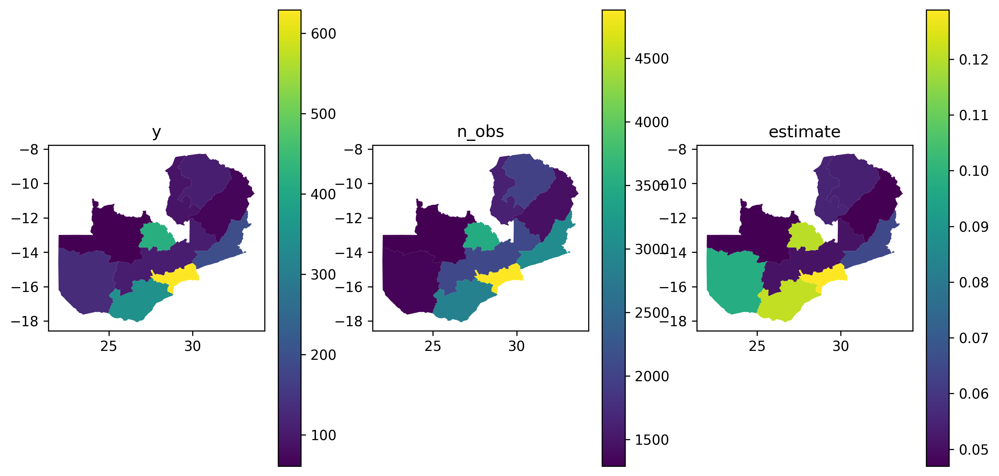

In [29]:
fig, ax = plt.subplots(1, 3, figsize=(12,6))
s_new.plot(column="y", ax=ax[0], legend=True)
s_new.plot(column="n_obs", ax=ax[1], legend=True)
s_new.plot(column="estimate", ax=ax[2], legend=True)
ax[0].set_title('y')
ax[1].set_title('n_obs')
ax[2].set_title('estimate')

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig('figures/ZMB2018_adm1_observations.pdf')

In [30]:
del shape_new
del infections_new

### Admin 2

In [31]:
# Create new rows with zero values
new_rows = pd.DataFrame({'area': ['CHIRUNDU', 'ITEZHI-TEZHI', 'SHIBUYUNJI'],
                             'usage': [0.0, 0.0, 0.0],
                             'num_rdt': [0.0, 0.0, 0.0],
                             'num_rdt_positive': [0.0, 0.0, 0.0],
                             'prev_estimate': [0.0, 0.0, 0.0]})

# Append new rows to infections_new
infections_old = pd.concat([infections_old, new_rows])

In [32]:
names_infections_old = infections_old.area.values
names_infections_old

array(['Chadiza', 'Chama', 'Chasefu', 'Chavuma', 'Chembe', 'Chibombo',
       'Chiengi', 'Chifunabuli', 'Chikankanta', 'Chilanga',
       'Chililabombwe', 'Chilubi', 'Chingola', 'Chinsali', 'Chipangali',
       'Chipata', 'Chipili', 'Chisamba', 'Chitambo', 'Choma', 'Chongwe',
       'Gwembe', 'Ikelenge', 'Isoka', 'Kabompo', 'Kabwe', 'Kafue',
       'Kalabo', 'Kalomo', 'Kalulushi', 'Kalumbila', 'Kanchibiya',
       'Kaoma', 'Kapiri Mposhi', 'Kaputa', 'Kasama', 'Kasempa',
       'Kasenengwa', 'Katete', 'Kawambwa', 'Kazungula', 'Kitwe',
       'Lavushimanda', 'Limulunga', 'Livingstone', 'Luampa', 'Luangwa',
       'Luano', 'Luanshya', 'Lufwanyama', 'Lukulu', 'Lumezi', 'Lundazi',
       'Lunga', 'Lunte District', 'Lupososhi', 'Lusaka', 'Luwingu',
       'Mafinga', 'Mambwe', 'Mansa', 'Manyinga', 'Masaiti', 'Mazabuka',
       'Mbala', 'Milengi', 'Mitete', 'Mkushi', 'Mongu', 'Monze', 'Mpika',
       'Mpongwe', 'Mporokoso', 'Mpulungu', 'Mufulira', 'Mufumbwe',
       'Mulobezi', 'Mumbwa', 'Mung

In [33]:
shape_old = shape_old.rename({'ADM2_EN': 'area'}, axis='columns')
shape_old = shape_old.sort_values(by=['area'])
shape_old.head(3)

,area,geometry,new
20,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",0
52,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",0
21,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",0


In [34]:
names_shape_old = shape_old['area'].values
names_shape_old

array(['CHADIZA', 'CHAMA', 'CHASEFU', 'CHAVUMA', 'CHEMBE', 'CHIBOMBO',
       'CHIENGI', 'CHIFUNABULI', 'CHIKANKANTA', 'CHILANGA',
       'CHILILABOMBWE', 'CHILUBI', 'CHINGOLA', 'CHINSALI', 'CHIPANGALI',
       'CHIPATA', 'CHIPILI', 'CHIRUNDU', 'CHISAMBA', 'CHITAMBO', 'CHOMA',
       'CHONGWE', 'GWEMBE', 'IKELENGE', 'ISOKA', 'ITEZHI-TEZHI',
       'KABOMPO', 'KABWE', 'KAFUE', 'KALABO', 'KALOMO', 'KALULUSHI',
       'KALUMBILA', 'KANCHIBIYA', 'KAOMA', 'KAPIRI MPOSHI', 'KAPUTA',
       'KASAMA', 'KASEMPA', 'KASENENGWA', 'KATETE', 'KAWAMBWA',
       'KAZUNGULA', 'KITWE', 'LAVUSHIMANDA', 'LIMULUNGA', 'LIVINGSTONE',
       'LUAMPA', 'LUANGWA', 'LUANO', 'LUANSHYA', 'LUFWANYAMA', 'LUKULU',
       'LUMEZI', 'LUNDAZI', 'LUNGA', 'LUNTE DISTRICT', 'LUPOSOSHI',
       'LUSAKA', 'LUWINGU', 'MAFINGA', 'MAMBWE', 'MANSA', 'MANYINGA',
       'MASAITI', 'MAZABUKA', 'MBALA', 'MILENGI', 'MITETE', 'MKUSHI',
       'MONGU', 'MONZE', 'MPIKA', 'MPONGWE', 'MPOROKOSO', 'MPULUNGU',
       'MUFULIRA', 'MUFUMBWE',

In [35]:
# convert to uppercase
names_infections_old = [names_infections_old[i].upper() for i in range(len(names_infections_old))]
print(names_infections_old)
print(names_shape_old)

['CHADIZA', 'CHAMA', 'CHASEFU', 'CHAVUMA', 'CHEMBE', 'CHIBOMBO', 'CHIENGI', 'CHIFUNABULI', 'CHIKANKANTA', 'CHILANGA', 'CHILILABOMBWE', 'CHILUBI', 'CHINGOLA', 'CHINSALI', 'CHIPANGALI', 'CHIPATA', 'CHIPILI', 'CHISAMBA', 'CHITAMBO', 'CHOMA', 'CHONGWE', 'GWEMBE', 'IKELENGE', 'ISOKA', 'KABOMPO', 'KABWE', 'KAFUE', 'KALABO', 'KALOMO', 'KALULUSHI', 'KALUMBILA', 'KANCHIBIYA', 'KAOMA', 'KAPIRI MPOSHI', 'KAPUTA', 'KASAMA', 'KASEMPA', 'KASENENGWA', 'KATETE', 'KAWAMBWA', 'KAZUNGULA', 'KITWE', 'LAVUSHIMANDA', 'LIMULUNGA', 'LIVINGSTONE', 'LUAMPA', 'LUANGWA', 'LUANO', 'LUANSHYA', 'LUFWANYAMA', 'LUKULU', 'LUMEZI', 'LUNDAZI', 'LUNGA', 'LUNTE DISTRICT', 'LUPOSOSHI', 'LUSAKA', 'LUWINGU', 'MAFINGA', 'MAMBWE', 'MANSA', 'MANYINGA', 'MASAITI', 'MAZABUKA', 'MBALA', 'MILENGI', 'MITETE', 'MKUSHI', 'MONGU', 'MONZE', 'MPIKA', 'MPONGWE', 'MPOROKOSO', 'MPULUNGU', 'MUFULIRA', 'MUFUMBWE', 'MULOBEZI', 'MUMBWA', 'MUNGWI', 'MUSHINDANO', 'MWANDI', 'MWANSABOMBWE', 'MWENSE', 'MWINILUNGA', 'NAKONDE', 'NALOLO', 'NAMWALA', 'NC

In [36]:
names_shape_old_lst = list(names_shape_old)
lst = [names_shape_old_lst[i] not in names_infections_old for i in range(len(names_shape_old))]
[i for i in range(len(lst)) if lst[i] == True]

[]

In [37]:
shape_old['area'] =  names_shape_old
infections_old.area = names_infections_old

In [38]:
shape_old = shape_old.merge(infections_old, how='left', left_on='area', right_on='area')
shape_old.head(3)

,area,geometry,new,usage,num_rdt,num_rdt_positive,prev_estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",0,0.592593,43.522101,2.352546,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",0,0.656690,219.745559,13.109616,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",0,0.491268,157.033307,2.872475,0.018292


In [39]:
print(np.sum(np.isnan(shape_old.num_rdt)))
print(np.sum(np.isnan(shape_old.num_rdt_positive)))

0
0


In [40]:
s_old = shape_old.rename({'num_rdt': 'n_obs', 'num_rdt_positive': 'y', 'prev_estimate': 'estimate'}, axis='columns')
s_old['y'] = round(s_old['y']).astype(int)
s_old['n_obs'] = round(s_old['n_obs']).astype(int)
s_old.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",0,0.592593,44,2,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",0,0.656690,220,13,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",0,0.491268,157,3,0.018292


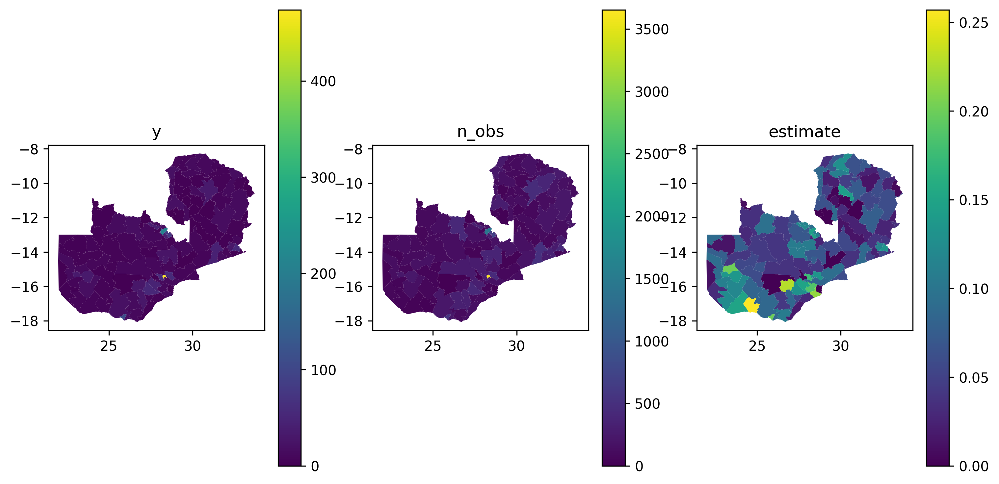

In [41]:
fig, ax = plt.subplots(1, 3, figsize=(12,6))
s_old.plot(column="y", ax=ax[0], legend=True)
s_old.plot(column="n_obs", ax=ax[1], legend=True)
s_old.plot(column="estimate", ax=ax[2], legend=True)
ax[0].set_title( 'y')
ax[1].set_title( 'n_obs')
ax[2].set_title( 'estimate')

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig('figures/ZMB2018_adm2_observations.pdf')

In [42]:
del shape_old
del infections_old

## Computational grid

In [43]:
x_min, x_max, y_min, y_max = 21.5, 34, -19, -8
dy = y_max - y_min
dx = x_max - x_min
factor = dy / dx
n_x = 40
n_y = math.ceil(n_x * factor)
print(n_x)
print(n_y)
print(n_x * n_y)

x_grid = np.linspace(x_min, x_max, n_x, endpoint=True)
y_grid = np.linspace(y_min, y_max, n_y, endpoint=True)

# full coordinate arrays
x_coords, y_coords = np.meshgrid(x_grid, y_grid)
x_coords = x_coords.reshape(-1)
y_coords = y_coords.reshape(-1)

df = pd.DataFrame({'Latitude': y_coords, 'Longitude': x_coords})

grid_pts = geopandas.GeoDataFrame(df, geometry=geopandas.points_from_xy(df.Longitude, df.Latitude))

x = jnp.array([x_coords, y_coords]).transpose((1, 0))
print(x.shape)

40
36
1440
(1440, 2)


2024-08-10 16:11:41.532868: W external/xla/xla/service/gpu/nvptx_compiler.cc:836] The NVIDIA driver's CUDA version is 12.4 which is older than the PTX compiler version (12.5.40). Because the driver is older than the PTX compiler version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


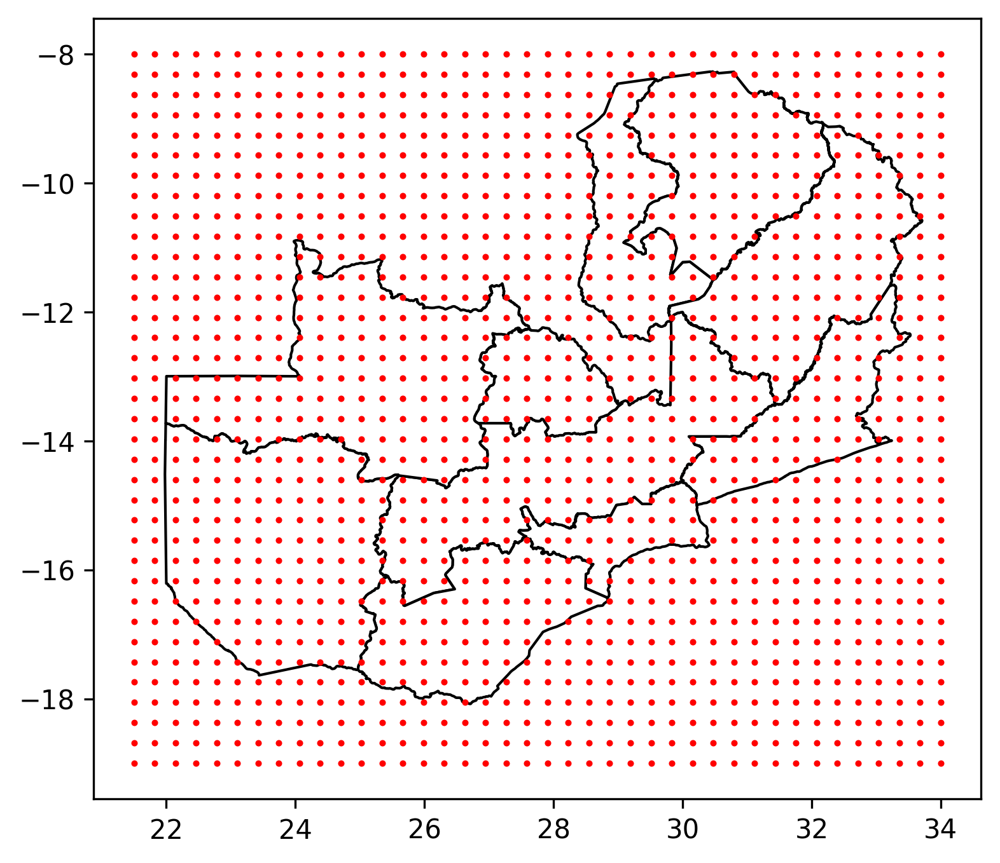

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(6,6))
divider = make_axes_locatable(ax)
s_new.plot(ax=ax, color='white', edgecolor='black')
grid_pts.plot(ax=ax, marker='o', color='red', markersize=2)

# save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_comp_grid{n_x}.pdf")

In [45]:
# def interpolate(polygon, min_pts=10):

#   # extract points from the polygon
#   x, y

In [46]:
def pol_pts(shape, grid_pts, min_pts=10):
    grid_pts.set_crs(epsg=4326, inplace=True);
    grid_pts.crs == shape.crs

    n_pol = len(shape.geometry)
    n_pts = len(grid_pts.geometry)

    pl_pt = np.zeros((n_pol, n_pts), dtype=int)

    pt_which_pol = np.zeros(n_pts, dtype=int)

    for i_pol in range(n_pol):
        pol = shape.geometry[i_pol]
        for j_pts in range(n_pts):
            pt = grid_pts.geometry[j_pts]
            if pol.contains(pt):
                pl_pt[i_pol, j_pts] = 1
                pt_which_pol[j_pts] = i_pol + 1 # note the enumeration!


    # ensure a minimum number of points

    pol_sums = np.sum(pl_pt, axis=1)

    fix_pols = np.where(pol_sums<min_pts)[0]

    if fix_pols.size > 0:

      for i_pol in fix_pols:

        # print(f'i_pol:{i_pol}')

        polygon = shape.geometry[i_pol]
        no_points = pol_sums[i_pol]

        extra_len = min_pts - no_points
        minx, miny, maxx, maxy = polygon.bounds
        extra_y_coords = []
        extra_x_coords = []

        main_rng_key = random.PRNGKey(44)

        # print(extra_len)

        while extra_len > 0:
            main_rng_key, rng_key_pts = random.split(main_rng_key)
            random_point_coords = [
                random.uniform(rng_key_pts, (1,), minval=minx, maxval=maxx)[0],
                random.uniform(rng_key_pts, (1,), minval=miny, maxval=maxy)[0]
            ]
            random_point = Point(float(random_point_coords[0]), float(random_point_coords[1]))

            if polygon.contains(random_point):
              # print('Contains random point')
              extra_y_coords.append(random_point.y)
              extra_x_coords.append(random_point.x)
              extra_len -= 1

        # add extra points to grid

        # Create DataFrame for new points
        extra_df = pd.DataFrame({'Latitude': extra_y_coords, 'Longitude': extra_x_coords})
        extra_grid_pts = gpd.GeoDataFrame(extra_df, geometry=gpd.points_from_xy(extra_df.Longitude, extra_df.Latitude))

        # Set CRS for the new GeoDataFrame
        extra_grid_pts.set_crs(epsg=4326, inplace=True)

        # Concatenate the original and new GeoDataFrames
        grid_pts = pd.concat([grid_pts, extra_grid_pts]).reset_index(drop=True)


      # Amend pl_pt and pt_which_pol (outside polygon loop)
      pl_pt, pt_which_pol, _ = pol_pts(shape, grid_pts, min_pts)

    return([pl_pt, pt_which_pol, grid_pts])

In [47]:
pol_pt_old, pt_which_pol_old, grid_pts_old = pol_pts(s_old, grid_pts, min_pts=10)
pol_sums_old = np.sum(pol_pt_old, axis=1) # how many points in each polygon
print(all(item >= 10 for item in pol_sums_old)) # in each polygon there is at least 10 points
grid_pts_old['pt_which_pol_old'] = pt_which_pol_old
np.where(pol_sums_old<10)
grid_pts_old

True


,Latitude,Longitude,geometry,pt_which_pol_old
0,-19.000000,21.500000,POINT (21.50000 -19.00000),0
1,-19.000000,21.820513,POINT (21.82051 -19.00000),0
2,-19.000000,22.141026,POINT (22.14103 -19.00000),0
3,-19.000000,22.461538,POINT (22.46154 -19.00000),0
4,-19.000000,22.782051,POINT (22.78205 -19.00000),0
...,...,...,...,...
2013,-17.455769,26.790142,POINT (26.79014 -17.45577),115
2014,-17.507141,26.722168,POINT (26.72217 -17.50714),115
2015,-17.777426,26.364519,POINT (26.36452 -17.77743),115
2016,-17.394756,26.870876,POINT (26.87088 -17.39476),115


In [48]:
pol_sums_old

array([10, 16, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 13, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 18, 10, 10, 10, 13, 10, 13, 10, 10, 10, 10, 11, 10,
       10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       10, 10, 10, 10, 13, 10, 10, 10, 10, 15, 10, 18, 10, 10, 10, 10, 10,
       17, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10,
       11, 10, 10, 10, 10, 10, 10, 10, 10, 11, 10, 12, 10])

In [49]:
pol_pt_new, pt_which_pol_new, grid_pts_new = pol_pts(s_new, grid_pts_old, min_pts=10)
pol_sums_new = np.sum(pol_pt_new, axis=1) # how many points in each polygon
# print(all(item > 0 for item in pol_sums_new)) # in each polygon there is at least one point
print(all(item > 10 for item in pol_sums_new)) # in each polygon there is at least 10 points
grid_pts_new['pt_which_pol_new'] = pt_which_pol_new
grid_pts_new

True


,Latitude,Longitude,geometry,pt_which_pol_old,pt_which_pol_new
0,-19.000000,21.500000,POINT (21.50000 -19.00000),0,0
1,-19.000000,21.820513,POINT (21.82051 -19.00000),0,0
2,-19.000000,22.141026,POINT (22.14103 -19.00000),0,0
3,-19.000000,22.461538,POINT (22.46154 -19.00000),0,0
4,-19.000000,22.782051,POINT (22.78205 -19.00000),0,0
...,...,...,...,...,...
2013,-17.455769,26.790142,POINT (26.79014 -17.45577),115,9
2014,-17.507141,26.722168,POINT (26.72217 -17.50714),115,9
2015,-17.777426,26.364519,POINT (26.36452 -17.77743),115,9
2016,-17.394756,26.870876,POINT (26.87088 -17.39476),115,9


In [50]:
pol_sums_new

array([122, 100, 130, 120,  80, 102, 133, 120, 133, 161])

In [51]:
new_y_coords = grid_pts_new['Latitude']
new_x_coords = grid_pts_new['Longitude']
new_x = jnp.array([new_x_coords, new_y_coords]).transpose((1, 0))
print(new_x.shape)

(2018, 2)


In [52]:
grid_pts = grid_pts_new

In [53]:
grid_pts['in_out_new'] = grid_pts['pt_which_pol_new'].apply(lambda x: 'out' if x==0 else 'in')
grid_pts['marker_size_new'] = grid_pts['pt_which_pol_new'].apply(lambda x: 1 if x==0 else 12)
n_pol_new = len(s_new.geometry)

grid_pts['in_out_old'] = grid_pts['pt_which_pol_old'].apply(lambda x: 'out' if x==0 else 'in')
grid_pts['marker_size_old'] = grid_pts['pt_which_pol_old'].apply(lambda x: 1 if x==0 else 12)
n_pol_old = len(s_old.geometry)

In [54]:
cmap = plt.cm.prism  # define the colormap
# extract all colors from the .jet map
cmaplist = [cmap(i) for i in range(cmap.N)]
# force the first color entry to be grey
cmaplist[0] = (.5, .5, .5, 1.0)
cmap = matplotlib.colors.LinearSegmentedColormap.from_list('Custom cmap', cmaplist, cmap.N)

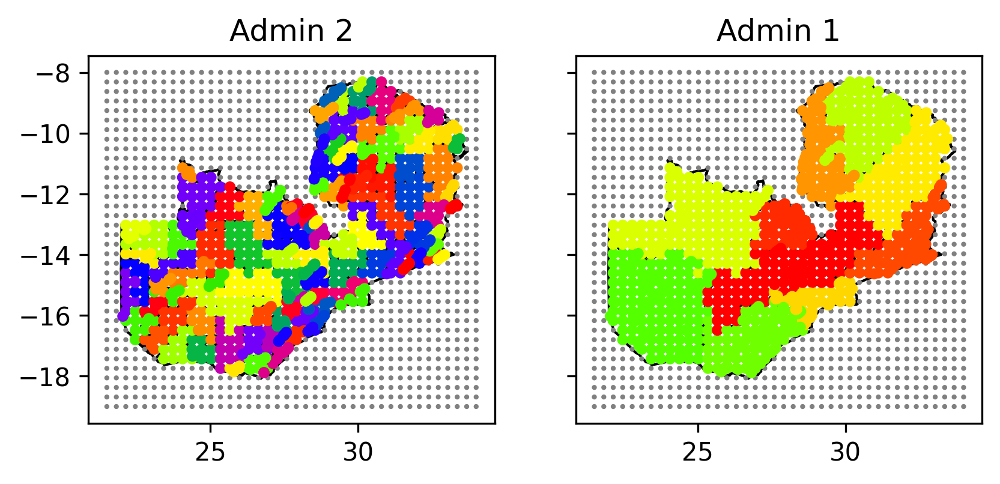

In [55]:
fig, (ax1, ax2) = plt.subplots(ncols=2, sharex=True, sharey=True)
divider = make_axes_locatable(ax)

# define the bins and normalize
bounds_old = np.linspace(min(pt_which_pol_old), max(pt_which_pol_old), n_pol_old)
norm_old = matplotlib.colors.BoundaryNorm(bounds_old, cmap.N)
s_old.plot(ax=ax1, color='white', edgecolor='black')
grid_pts.plot(ax=ax1, marker='o', column='pt_which_pol_old', markersize='marker_size_old', cmap=cmap)
ax1.title.set_text('Admin 2')

# define the bins and normalize
bounds_new = np.linspace(min(pt_which_pol_new), max(pt_which_pol_new), n_pol_new)
norm_new = matplotlib.colors.BoundaryNorm(bounds_new, cmap.N)
s_new.plot(ax=ax2, color='white', edgecolor='black')
grid_pts.plot(ax=ax2, marker='o', column='pt_which_pol_new', markersize='marker_size_new', cmap=cmap)
ax2.title.set_text('Admin 1')

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_grid_polygons_all_admin_grid{n_x}.pdf")

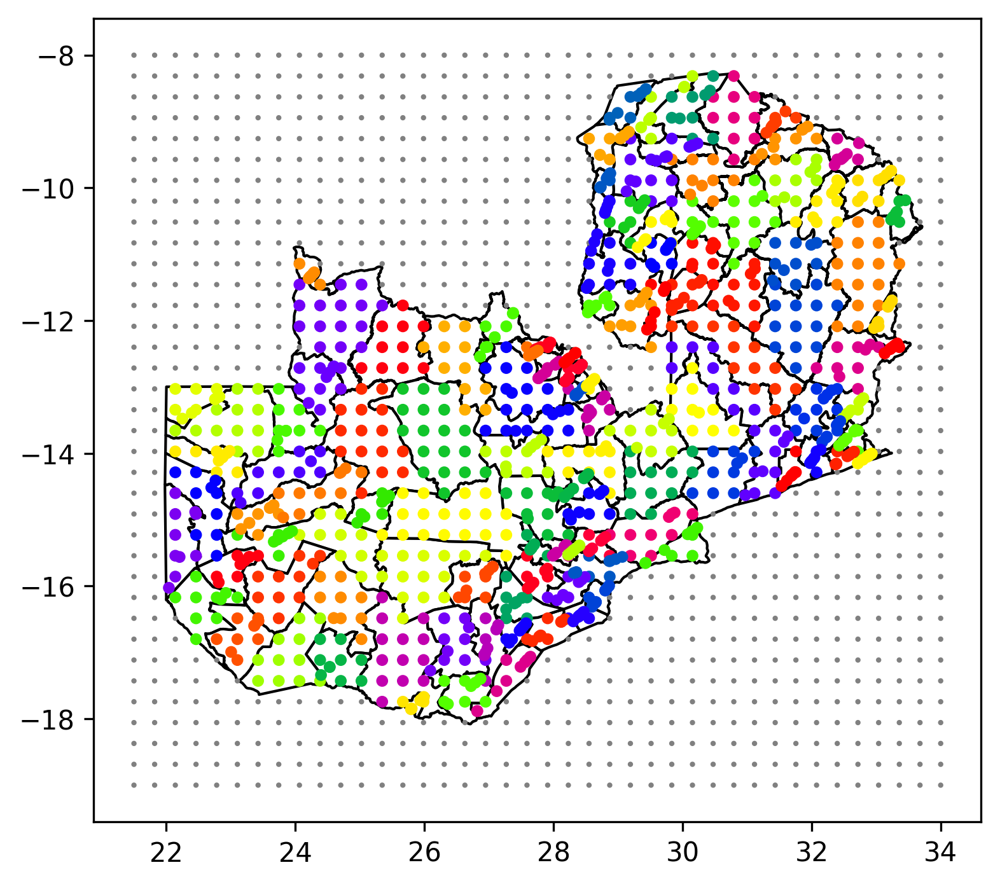

In [56]:
fig, ax1 = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(6,6))
divider = make_axes_locatable(ax)

# define the bins and normalize
bounds_old = np.linspace(min(pt_which_pol_old), max(pt_which_pol_old), n_pol_old)
norm_old = matplotlib.colors.BoundaryNorm(bounds_old, cmap.N)
s_old.plot(ax=ax1, color='white', edgecolor='black')
grid_pts.plot(ax=ax1, marker='o', column='pt_which_pol_old', markersize='marker_size_old', cmap=cmap)
#ax1.title.set_text('Before 2010')

# define the bins and normalize
#bounds_new = np.linspace(min(pt_which_pol_new), max(pt_which_pol_new), n_pol_new)
#norm_new = matplotlib.colors.BoundaryNorm(bounds_new, cmap.N)
#s_new.plot(ax=ax2, color='white', edgecolor='black')
#grid_pts.plot(ax=ax2, marker='o', column='pt_which_pol_new', markersize='marker_size_new', cmap=cmap)
#ax2.title.set_text('After 2010')

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_grid_polygons_admin2_grid{n_x}.pdf")

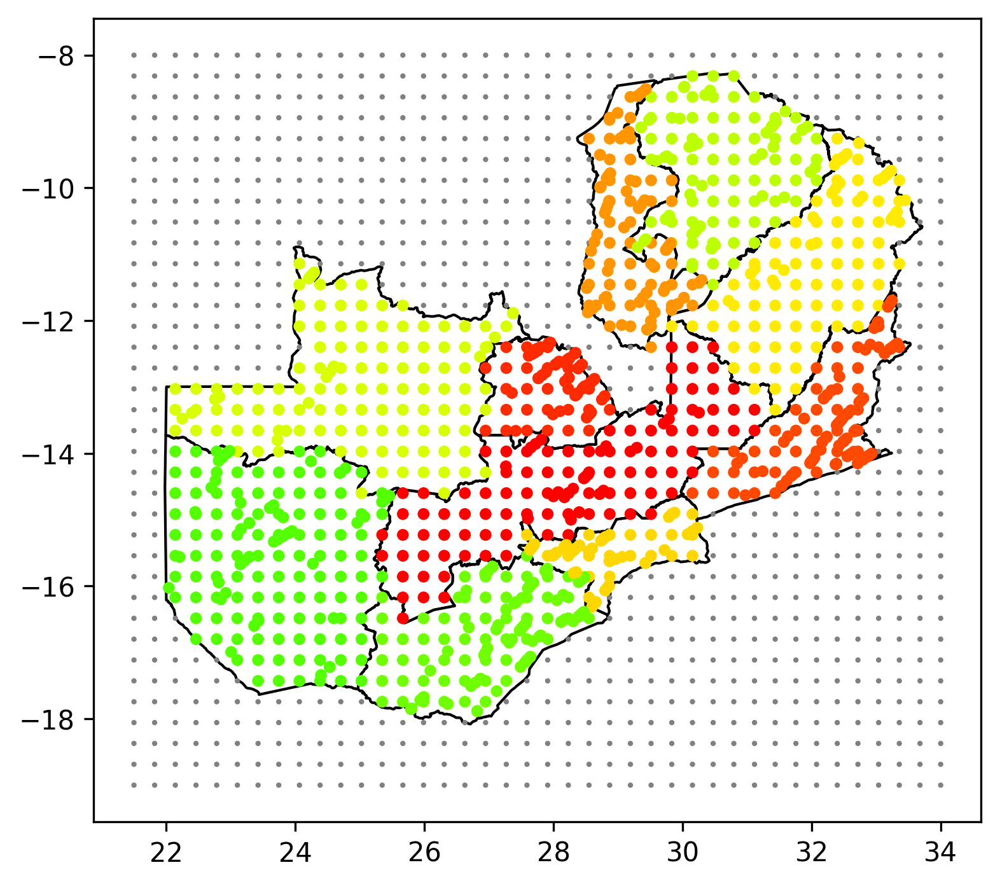

In [57]:
fig, ax2 = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(6,6))
divider = make_axes_locatable(ax)

# define the bins and normalize
bounds_new = np.linspace(min(pt_which_pol_new), max(pt_which_pol_new), n_pol_new)
norm_new = matplotlib.colors.BoundaryNorm(bounds_new, cmap.N)
s_new.plot(ax=ax2, color='white', edgecolor='black')
grid_pts.plot(ax=ax2, marker='o', column='pt_which_pol_new', markersize='marker_size_new', cmap=cmap)
#ax2.title.set_text('After 2010')

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_grid_polygons_admin1_grid{n_x}.pdf")

In [58]:
s_old.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",0,0.592593,44,2,0.054054
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",0,0.656690,220,13,0.059658
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",0,0.491268,157,3,0.018292


In [59]:
s_new.head(3)

,area,geometry,new,usage,n_obs,y,estimate
0,CENTRAL,"POLYGON ((29.99949 -12.00267, 30.00002 -12.002...",1,0.379661,2073,106,0.051102
1,COPPERBELT,"POLYGON ((27.94644 -12.28198, 27.95514 -12.297...",1,0.444083,3490,420,0.120391
2,EASTERN,"POLYGON ((33.25764 -11.58238, 33.26164 -11.585...",1,0.547537,3013,195,0.064639


In [60]:
type(s_new)

geopandas.geodataframe.GeoDataFrame

In [61]:
s = pd.concat([s_old, s_new])
s.head()
print(s.shape)

(125, 7)


# Traditional prevalence model

In [62]:
n_old, _= s_old.shape
n_new, _= s_new.shape

In [63]:
# draw GP samples on the grid

def dist_euclid(x, z):
    x = jnp.array(x)
    z = jnp.array(z)
    if len(x.shape)==1:
        x = x.reshape(x.shape[0], 1)
    if len(z.shape)==1:
        z = x.reshape(x.shape[0], 1)
    n_x, m = x.shape
    n_z, m_z = z.shape
    assert m == m_z
    delta = jnp.zeros((n_x,n_z))
    for d in jnp.arange(m):
        x_d = x[:,d]
        z_d = z[:,d]
        delta += (x_d[:,jnp.newaxis] - z_d)**2
    return jnp.sqrt(delta)


def exp_sq_kernel(x, z, var, length, noise, jitter=1.0e-4):
    dist = dist_euclid(x, z)
    deltaXsq = jnp.power(dist/ length, 2.0)
    k = var * jnp.exp(-0.5 * deltaXsq)
    k += (noise + jitter) * jnp.eye(x.shape[0])
    return k

In [64]:
def M_g(M, g, averages=False, grid_nb_vec=None):
    '''
    - $M$ is a matrix with binary entries $m_{ij},$ showing whether point $j$ is in polygon $i$
    - $g$ is a vector of GP draws over grid
    - $maltmul(M, g)$ gives a vector of sums over each polygon
    '''
    M = jnp.array(M)
    g = jnp.array(g).T
    if averages:
      return (jnp.multiply(jnp.matmul(M, g), jnp.reciprocal(grid_nb_vec)))
    else:
      return(jnp.matmul(M, g))

In [65]:
args = {'n_obs': jnp.array(s.n_obs),
        "x": new_x,
        "gp_kernel": exp_sq_kernel,
        "batch_size": 1,
        "jitter": 1e-4,
        "M_old": pol_pt_old,
        "M_new": pol_pt_new,
}

In [66]:
# def prev_model_gp_aggr(args, y=None):

#     n_obs = args['n_obs']
#     x = args["x"]
#     gp_kernel=args["gp_kernel"]
#     jitter = args["jitter"]
#     M_old = args["M_old"]
#     M_new = args["M_new"]

#     # random effect - aggregated GP
#     length = numpyro.sample("kernel_length", dist.InverseGamma(3,3))
#     var = numpyro.sample("kernel_var", dist.HalfNormal(0.05))
#     k = gp_kernel(x, x, var, length, jitter)
#     f = numpyro.sample("f", dist.MultivariateNormal(loc=jnp.zeros(x.shape[0]), covariance_matrix=k))

#     # aggregate f into gp_aggr according to indexing of (point in polygon)
#     gp_aggr_old = numpyro.deterministic('gp_aggr_old', M_g(M_old, f))
#     gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f))
#     gp_aggr = numpyro.deterministic('gp_aggr', jnp.concatenate([gp_aggr_old, gp_aggr_new]))

#     # fixed effects
#     b0 = numpyro.sample('b0', dist.Normal(0, 1))

#     # linear predictor
#     lp = b0 + gp_aggr
#     theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

#     numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

In [67]:
# rng_key, rng_key_predict = random.split(random.PRNGKey(1))
# prev_predictive = Predictive(prev_model_gp_aggr, num_samples=args["batch_size"])
# gp_draws = prev_predictive(rng_key_predict, args)['f']

In [68]:
# rng_key, rng_key_predict = random.split(random.PRNGKey(3))
# kernel = NUTS(prev_model_gp_aggr)
# n_warm = 200
# n_samps = 1000
# mcmc_gp_aggr = MCMC(kernel, num_warmup=n_warm, num_samples=n_samps)

In [69]:
# # inference
# run_mcmc = False

# if run_mcmc:
#     start = time.time()
#     mcmc_gp_aggr.run(rng_key, args, y = jnp.array(s.y))
#     t_elapsed = time.time() - start

In [70]:
# save MCMC
#with open('MCMCs/prev_model_gp_aggr_joint_{}iter_lsIG3_3_20230214'.format(n_samps), 'wb') as file:
#    dill.dump(mcmc_gp_aggr, file)

In [71]:
# load MCMC
#with open('MCMCs/prev_model_gp_aggr_joint_{}iter_lsIG3_3_20230214'.format(n_samps), 'rb') as file:
#    mcmc_gp_agg = dill.load(file)

In [72]:
# if run_mcmc:
#     prev_samples_aggr = mcmc_gp_aggr.get_samples()
#     mcmc_gp_aggr.print_summary(exclude_deterministic=False)

#     print("\nMCMC elapsed time:", round(t_elapsed), "s")
#     print("\nMCMC elapsed time:", round(t_elapsed/60), "min")
#     print("\nMCMC elapsed time:", round(t_elapsed/(60*60)), "h")

#     ss = numpyro.diagnostics.summary(mcmc_gp_aggr.get_samples(group_by_chain=True))
#     r = np.mean(ss['gp_aggr']['n_eff'])
#     print("Average ESS for all aggGP effects : " + str(round(r)))

#     r = np.mean(ss['gp_aggr_old']['n_eff'])
#     print("Average ESS for all aggGP-old effects : " + str(round(r)))
#     print("Max r_hat for all aggGP-old effects : " + str(round(np.max(ss['gp_aggr_old']['r_hat']),2)))

#     r = np.mean(ss['gp_aggr_new']['n_eff'])
#     print("Average ESS for all aggGP-new effects : " + str(round(r)))
#     print("Max r_hat for all aggGP-new effects : " + str(round(np.max(ss['gp_aggr_new']['r_hat']),2)))

#     print("kernel_length R-hat : " + str(round(ss['kernel_length']['r_hat'],2)))
#     print("kernel_var R-hat : " + str(round(ss['kernel_var']['r_hat'],2)))

In [73]:
# import arviz as az
# prev_samples_az_gp = az.from_numpyro(mcmc_gp_aggr)
# az.plot_trace(prev_samples_az_gp,  var_names=("kernel_length"))

# #plt.rcParams['figure.dpi'] = 300
# #plt.rcParams['savefig.dpi'] = 300
# #plt.savefig('res/arviz_length.pdf')

# az.plot_trace(prev_samples_az_gp,  var_names=("kernel_var"))

# #plt.rcParams['figure.dpi'] = 300
# #plt.rcParams['savefig.dpi'] = 300
# #plt.savefig('res/arviz_var.pdf')

In [74]:
# # posterior predictive
# prev_posterior_predictive_gp = Predictive(prev_model_gp_aggr, prev_samples_aggr)(random.PRNGKey(1), args)

# theta_samps_gp = prev_posterior_predictive_gp['theta']

In [75]:
# theta_samps_gp.shape
# theta_mean_gp = theta_samps_gp.mean(axis=0)
# bci_gp_25 = np.quantile(theta_samps_gp, 0.25, axis=0)
# bci_gp_75 = np.quantile(theta_samps_gp, 0.75, axis=0)

# s['theta_gp'] = theta_mean_gp

# theta_observed = s['estimate']
# theta_estimated_gp = s['theta_gp']

# _max = np.max([theta_observed, theta_estimated_gp])
# _min = np.min([theta_observed, theta_estimated_gp])

# n_old, _= s_old.shape
# n_new, _= s_new.shape

# fig, ax = plt.subplots(1, 2, figsize=(12,6))

# s[0:n_old].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
# s[0:n_old].plot(column="theta_gp", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

# ax[0].set_title( 'Before: Observed prevalence')
# ax[1].set_title( 'Before: Estimated prevalence (aggregated GP)')

In [76]:
# fig, ax = plt.subplots(1, 2, figsize=(12,6))

# s[n_old:(n_old + n_new)].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
# s[n_old:(n_old + n_new)].plot(column="theta_gp", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

# ax[0].set_title( 'After: Observed prevalence')
# ax[1].set_title( 'After: Estimated prevalence (aggregated GP)')

In [77]:
# fig, ax = plt.subplots(1, 2, figsize=(10,5))

# ax[0].scatter(s[0:n_old].estimate, s[0:n_old].theta_gp)
# ax[0].set_ylim(_min-0.02, _max+0.02)
# ax[0].set_xlim(_min-0.02, _max+0.02)
# ax[0].axline((1, 1), slope=1, ls="--", c=".3")
# ax[0].set_xlabel("Observed prevalence")
# ax[0].set_ylabel("Estimated prevalence")
# ax[0].set_title("Before 2010")

# ax[1].scatter(s[n_old:(n_old + n_new)].estimate, s[n_old:(n_old + n_new)].theta_gp)
# ax[1].set_ylim(_min-0.02, _max+0.02)
# ax[1].set_xlim(_min-0.02, _max+0.02)
# ax[1].axline((1, 1), slope=1, ls="--", c=".3")
# ax[1].set_xlabel("Observed prevalence")
# ax[1].set_ylabel("Estimated prevalence, aggGP")
# ax[1].set_title("After 2010")

# #plt.rcParams['figure.dpi'] = 300
# #plt.rcParams['savefig.dpi'] = 300
# #plt.savefig('res/est_obs_gp.pdf')

# Train VAE

In [78]:
s_old_plot = s[0:n_old].copy()
s_new_plot = s[n_old:(n_old + n_new)].copy()

In [79]:
args = {'n_obs': jnp.array(s.n_obs),
        "x": new_x,
        "gp_kernel": exp_sq_kernel,
        "jitter": 1e-4,
        "M_old": pol_pt_old,
        "M_new": pol_pt_new,
        "encode_avg": True,
        "encode_avg_name": "encode_avg",

        # VAE training
        "rng_key": random.PRNGKey(5),
        "num_epochs": 50,
        # "learning_rate": 1.0e-3,
        "hyperprior_ls_name": "Gamma(3, 10)",
        "hyperprior_var_name": "Gamma(8, 100)",
        "hyperprior_ls": dist.Gamma(3, 10),
        "hyperprior_var": dist.Gamma(8, 100),
        "learning_rate": 0.0005,
        "batch_size": 5,
        "hidden_dim": 1024,
        "z_dim": 512,
        "num_train": 1000,
        "num_test":1000,
        "vae_var": 1,
        "num_mcmc_samples": 1500,
        "num_warmup": 200,
        "num_samples_posterior": 1000
        
}

In [80]:
model_specs =('_all_admin' +
              '_mcmcsamp' + str(args['num_mcmc_samples'])+
             '_h' + str(args["hidden_dim"])+
             '_z' + str(args["z_dim"])+
             '_epochs' + str(args["num_epochs"])+
             '_ls' + args['hyperprior_ls_name']+
             '_var' + args['hyperprior_var_name'])
print('Model specifications:', model_specs)

Model specifications: _all_admin_mcmcsamp1500_h1024_z512_epochs50_lsGamma(3, 10)_varGamma(8, 100)


In [81]:
# Create the new directory
os.makedirs('figures/ZMB2018_aggVAE'+model_specs, exist_ok=True)

In [82]:
def gp_aggr(args):

    x = args["x"]
    gp_kernel=args["gp_kernel"]
    jitter = args["jitter"]
    M_old = args["M_old"]
    M_new = args["M_new"]

    # random effect - aggregated GP
    # length = numpyro.sample("kernel_length", dist.InverseGamma(3,3))
    length = numpyro.sample("kernel_length", args['hyperprior_ls'])
    var = numpyro.sample("kernel_var", args['hyperprior_var'])
    k = gp_kernel(x, x, var, length, jitter)
    f = numpyro.sample("f", dist.MultivariateNormal(loc=jnp.zeros(x.shape[0]), covariance_matrix=k))

    # aggregate f into gp_aggr according to indexing of (point in polygon)
    # gp_aggr_old = numpyro.deterministic('gp_aggr_old', M_g(M_old, f, averages=True, obs_vec=jnp.array(s_old_plot['n_obs'])))
    if args["encode_avg"]:
        gp_aggr_old = numpyro.deterministic('gp_aggr_old', M_g(M_old, f, averages=True, grid_nb_vec=pol_sums_old))
        gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f, averages=True, grid_nb_vec=pol_sums_new))
    else:
        gp_aggr_old = numpyro.deterministic('gp_aggr_old', M_g(M_old, f))
        gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f))
    
    # gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f, averages=True, obs_vec=jnp.array(s_new_plot['n_obs'])))
    gp_aggr = numpyro.deterministic('gp_aggr', jnp.concatenate([gp_aggr_old, gp_aggr_new]))

In [83]:
# from scipy.stats import invgamma

# # Generate samples
# inv_gamma_dist = invgamma(a=3, scale=3)
# samples = inv_gamma_dist.rvs(size=1000)
# x = np.linspace(0.01, 10, 1000)
# pdf = inv_gamma_dist.pdf(x)

# # Plot the histogram of the samples
# plt.figure(figsize=(10, 6))
# plt.hist(samples, bins=50, density=True, alpha=0.6, color='g', label='Samples')

# # Plot the PDF of the Inverse Gamma distribution
# plt.plot(x, pdf, 'r-', lw=2, label='Inverse Gamma PDF')

# # Add labels and title
# plt.xlabel('Value')
# plt.ylabel('Density')
# plt.title('Inverse Gamma Distribution (alpha=3, beta=3)')
# plt.legend()

# # Show the plot
# plt.show()

In [84]:
# aggGP: prior predictive

rng_key, rng_key_ = random.split(random.PRNGKey(4))
agg_gp_predictive = Predictive(gp_aggr, num_samples=5)
agg_gp_preds = agg_gp_predictive(rng_key_, args)
agg_gp_draws = agg_gp_preds['gp_aggr']

In [85]:
agg_gp_draws.shape

(5, 125)

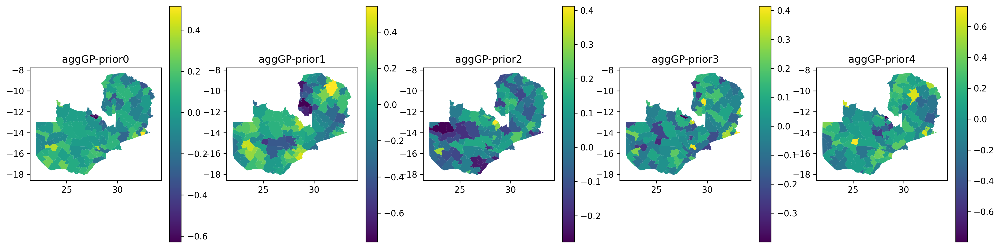

In [86]:
s_old_plot = s[0:n_old].copy()

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_old_plot[nm] = agg_gp_draws[i,0:n_old]
    s_old_plot.plot(column=nm, ax=axs[i], legend=True)
    axs[i].set_title( 'aggGP-prior' + str(i))

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_admin2_priors_before.pdf")

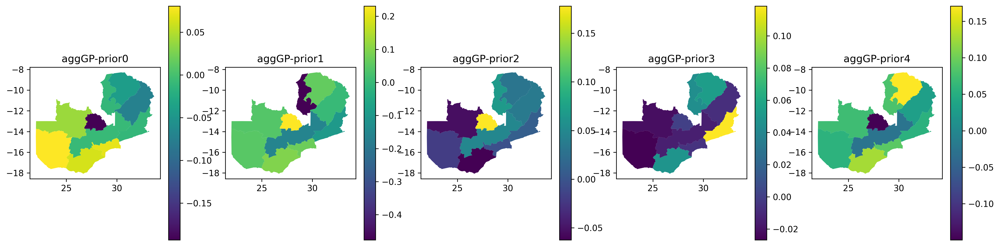

In [87]:
s_new_plot = s[n_old:(n_old + n_new)].copy()

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_new_plot[nm] = agg_gp_draws[i,n_old:(n_old + n_new)]
    s_new_plot.plot(column=nm, ax=axs[i], legend=True)
    axs[i].set_title( 'aggGP-prior' + str(i))

# Save
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_admin2_priors_after.pdf")

In [88]:
def vae_encoder(hidden_dim, z_dim):
    return stax.serial(
        stax.Dense(hidden_dim, W_init=stax.randn()),
        stax.Elu,
        stax.FanOut(2),
        stax.parallel(
            stax.Dense(z_dim, W_init=stax.randn()), # mean
            stax.serial(stax.Dense(z_dim, W_init=stax.randn()), stax.Exp), # std -- i.e. diagonal covariance
        ),
    )


def vae_decoder( hidden_dim, out_dim):
    return stax.serial(
        stax.Dense(hidden_dim, W_init=stax.randn()),
        stax.Elu,
        stax.Dense(out_dim, W_init=stax.randn())
    )

def vae_model(batch, hidden_dim, z_dim):
    batch = jnp.reshape(batch, (batch.shape[0], -1))
    batch_dim, out_dim = jnp.shape(batch)
    decode = numpyro.module("decoder", vae_decoder( hidden_dim, out_dim), (batch_dim, z_dim))
    z = numpyro.sample("z", dist.Normal(jnp.zeros((z_dim,)), jnp.ones((z_dim,))))
    gen_loc = decode(z)
    numpyro.sample("obs", dist.Normal(gen_loc, args["vae_var"]), obs=batch)


def vae_guide(batch, hidden_dim,  z_dim):
    batch = jnp.reshape(batch, (batch.shape[0], -1))
    batch_dim, out_dim = jnp.shape(batch)
    encode = numpyro.module("encoder", vae_encoder(hidden_dim, z_dim), (batch_dim, out_dim))
    z_loc, z_std = encode(batch)
    z_loc = jnp.mean(z_loc, axis=0)  # Aggregate batch dimension
    z_std = jnp.mean(z_std, axis=0)  # Aggregate batch dimension
    z = numpyro.sample("z", dist.Normal(z_loc, z_std))
    return z

In [89]:
@jit
def epoch_train(rng_key, svi_state, num_train):

    def body_fn(i, val):
        rng_key_i = random.fold_in(rng_key, i)
        rng_key_i, rng_key_ls, rng_key_var, rng_key_noise = random.split(rng_key_i, 4)
        loss_sum, svi_state = val # val -- svi_state
        batch = agg_gp_predictive(rng_key_i, args)['gp_aggr']
        svi_state, loss = svi.update(svi_state, batch)
        loss_sum += loss / args['batch_size']
        return loss_sum, svi_state

    return lax.fori_loop(0, num_train, body_fn, (0.0, svi_state)) #fori_loop(lower, upper, body_fun, init_val)

@jit
def eval_test(rng_key, svi_state, num_test):

    def body_fn(i, loss_sum):
        rng_key_i = random.fold_in(rng_key, i)
        rng_key_i, rng_key_ls, rng_key_var, rng_key_noise = random.split(rng_key_i, 4)
        batch = agg_gp_predictive(rng_key_i, args)['gp_aggr']
        loss = svi.evaluate(svi_state, batch) / args['batch_size']
        loss_sum += loss
        return loss_sum

    loss = lax.fori_loop(0, num_test, body_fn, 0.0)
    loss = loss / num_test

    return loss

In [90]:
adam = optim.Adam(step_size=args["learning_rate"])

svi = SVI(vae_model, vae_guide, adam, RenyiELBO(),
          hidden_dim=args["hidden_dim"],
          z_dim=args["z_dim"])

rng_key, rng_key_samp, rng_key_init = random.split(args["rng_key"], 3)
init_batch = agg_gp_predictive(rng_key_, args)['gp_aggr']
svi_state = svi.init(rng_key_init, init_batch)

In [91]:
from datetime import datetime

now = datetime.now()
current_time = now.strftime("%H:%M:%S")
print("Current Time =", current_time)

test_loss_list = []

for i in range(args['num_epochs']):

    rng_key, rng_key_train, rng_key_test, rng_key_infer = random.split(rng_key, 4)

    t_start = time.time()

    num_train = 1000
    # num_train = 10
    _, svi_state = epoch_train(rng_key_train, svi_state, num_train)

    num_test = 1000
    # num_test = 10
    test_loss = eval_test(rng_key_test, svi_state, num_test)
    test_loss_list += [test_loss]

    print("Epoch {}: loss = {} ({:.2f} s.)".format(i, test_loss, time.time() - t_start))

    if math.isnan(test_loss): break

Current Time = 16:11:56
Epoch 0: loss = 117.91170501708984 (21.74 s.)
Epoch 1: loss = 117.76176452636719 (17.39 s.)
Epoch 2: loss = 117.9127426147461 (17.38 s.)
Epoch 3: loss = 118.0791244506836 (17.39 s.)
Epoch 4: loss = 117.99256134033203 (17.38 s.)
Epoch 5: loss = 118.04643249511719 (17.39 s.)
Epoch 6: loss = 118.33358001708984 (17.38 s.)
Epoch 7: loss = 118.20609283447266 (17.40 s.)
Epoch 8: loss = 118.19401550292969 (17.38 s.)
Epoch 9: loss = 118.26670837402344 (17.39 s.)
Epoch 10: loss = 118.0295639038086 (17.37 s.)
Epoch 11: loss = 118.01728057861328 (17.38 s.)
Epoch 12: loss = 118.32788848876953 (17.37 s.)
Epoch 13: loss = 118.15868377685547 (17.38 s.)
Epoch 14: loss = 118.30443572998047 (17.37 s.)
Epoch 15: loss = 118.4505386352539 (17.38 s.)
Epoch 16: loss = 118.29885864257812 (17.37 s.)
Epoch 17: loss = 118.16414642333984 (17.38 s.)
Epoch 18: loss = 118.15398406982422 (17.37 s.)
Epoch 19: loss = 118.32404327392578 (17.38 s.)
Epoch 20: loss = 118.22350311279297 (17.38 s.)
Epo

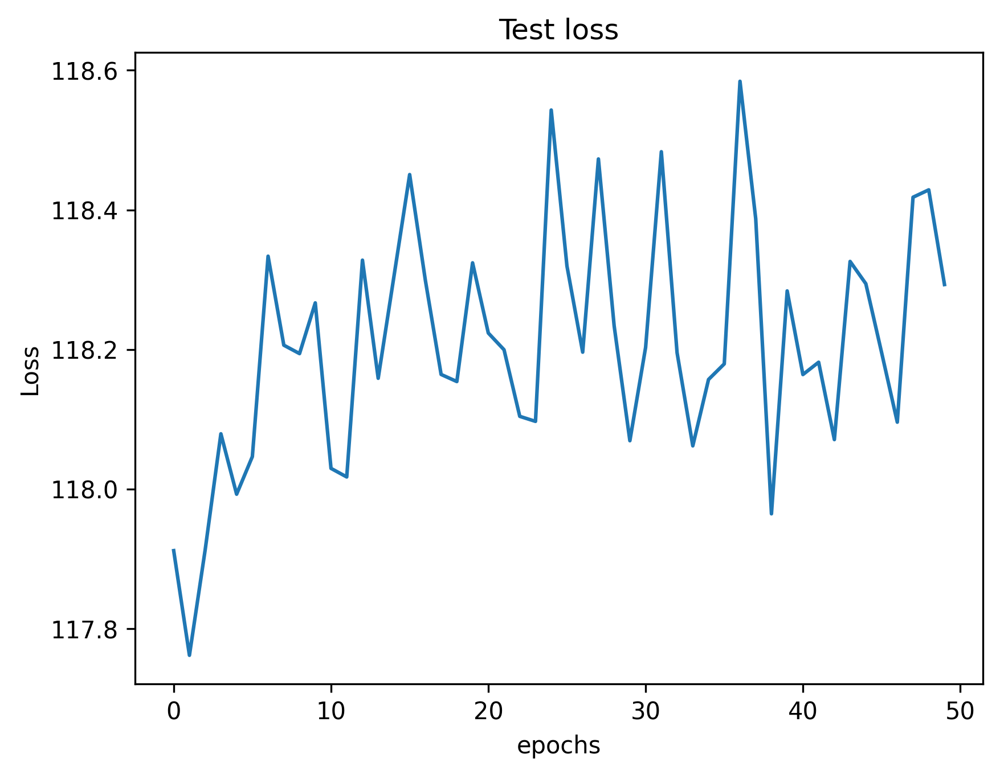

In [92]:
plt.plot(np.arange(0, len(test_loss_list), 1), test_loss_list, label="test loss")
plt.xlabel("epochs")
plt.ylabel("Loss")
plt.title("Test loss")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig('figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+model_specs+'_loss_complete.pdf')

In [93]:
n_x

40

In [94]:
decoder_params = svi.get_params(svi_state)["decoder$params"]
args["decoder_params"] = decoder_params

In [95]:
args["vae_var"]

1

In [96]:
# have to add number of epochs in training so that the name is relevant
model_save_name = f'aggVAE_decoder' + model_specs
PATH = F"decoders/{model_save_name}"
PATH_loss = F"losses/{model_save_name}"

In [97]:
# Save
with open(PATH, 'wb') as file:
   pickle.dump(decoder_params, file)

with open(PATH_loss, 'wb') as file:
   pickle.dump({'val_losses':test_loss_list}, file)

In [98]:
# Load
with open(PATH, 'rb') as file:
   decoder_params = pickle.load(file)
   print(len(decoder_params))

args["decoder_params"] = decoder_params

3


In [99]:
with open(PATH_loss, 'rb') as file:
   losses_save = pickle.load(file)

val_losses_save = losses_save['val_losses']

print(losses_save)

{'val_losses': [Array(117.911705, dtype=float32), Array(117.761765, dtype=float32), Array(117.91274, dtype=float32), Array(118.079124, dtype=float32), Array(117.99256, dtype=float32), Array(118.04643, dtype=float32), Array(118.33358, dtype=float32), Array(118.20609, dtype=float32), Array(118.194016, dtype=float32), Array(118.26671, dtype=float32), Array(118.029564, dtype=float32), Array(118.01728, dtype=float32), Array(118.32789, dtype=float32), Array(118.15868, dtype=float32), Array(118.304436, dtype=float32), Array(118.45054, dtype=float32), Array(118.29886, dtype=float32), Array(118.16415, dtype=float32), Array(118.153984, dtype=float32), Array(118.32404, dtype=float32), Array(118.2235, dtype=float32), Array(118.19952, dtype=float32), Array(118.104126, dtype=float32), Array(118.096924, dtype=float32), Array(118.543, dtype=float32), Array(118.31945, dtype=float32), Array(118.19609, dtype=float32), Array(118.47289, dtype=float32), Array(118.23382, dtype=float32), Array(118.069214, dty

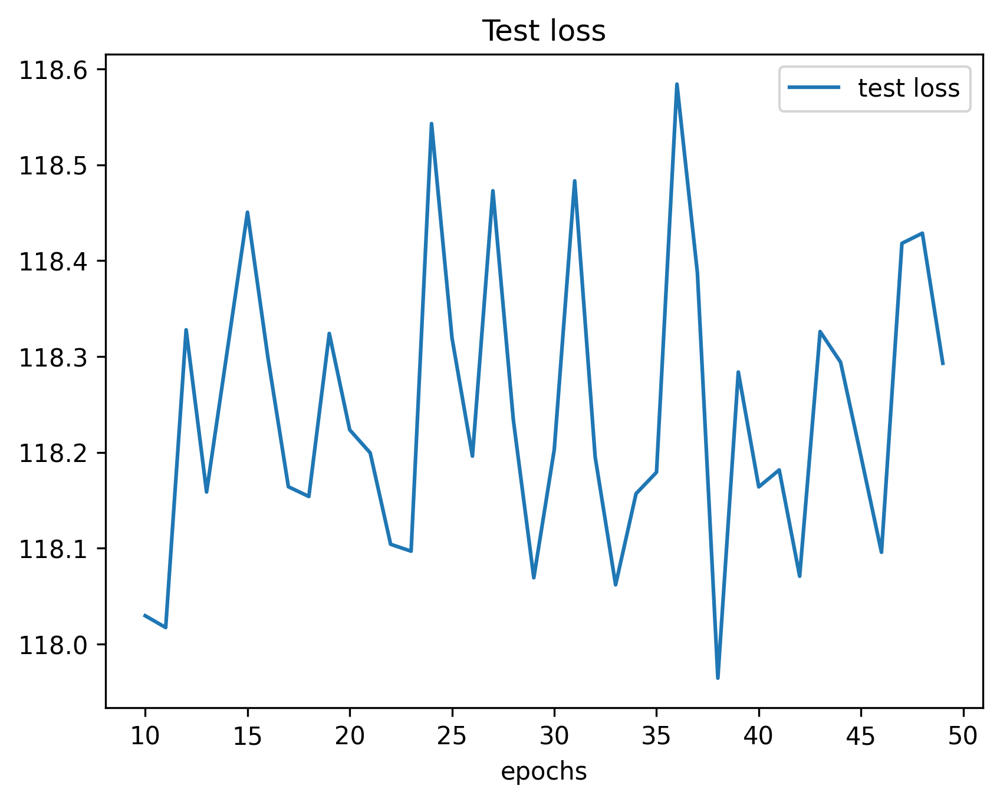

In [100]:
plt.plot(np.arange(10, len(val_losses_save), 1), val_losses_save[10:], label="test loss")
plt.xlabel("epochs")
plt.legend()
plt.title("Test loss")

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig('figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+model_specs+'_loss_short.pdf')

In [101]:
decode_dict = {'decoder': decoder_params}
decode_dict

{'decoder': [(Array([[ 3.6904551e-02, -1.7813329e-02,  1.4024382e-03, ...,
            7.4273054e-03,  1.9769458e-02,  2.1850239e-02],
          [ 2.6560586e-02, -2.9501639e-02,  1.2957065e-02, ...,
           -4.7200830e-03,  3.6994934e-02,  7.8206771e-04],
          [-1.1710607e-03, -1.9785760e-03, -1.0404038e-02, ...,
           -3.7350401e-03, -4.6512112e-03, -8.1315953e-03],
          ...,
          [ 5.7413224e-03,  1.6303599e-02,  2.4800587e-03, ...,
            3.3661760e-03,  4.0842644e-03, -1.4235456e-02],
          [-1.2212717e-05,  1.2175926e-02, -1.3493453e-02, ...,
           -1.0785502e-02,  1.1163216e-02,  2.4087126e-03],
          [ 1.3685450e-02, -2.6726337e-02,  2.6403518e-02, ...,
           -1.4895649e-02,  2.0407567e-02, -8.5870074e-03]], dtype=float32),
   Array([-0.07386581, -0.08614987, -0.0872266 , ..., -0.0882761 ,
          -0.08097401, -0.10199346], dtype=float32)),
  (),
  (Array([[-8.1824296e-04,  3.9388303e-04, -5.5597820e-03, ...,
           -2.0201462e

In [102]:
decoder_params[2]

(Array([[-8.1824296e-04,  3.9388303e-04, -5.5597820e-03, ...,
         -2.0201462e-04,  9.9542625e-03,  2.7825932e-03],
        [-5.2185585e-03,  2.0420502e-03,  4.4106608e-03, ...,
          6.3043591e-03,  7.7883742e-04,  7.0485963e-05],
        [-2.4079557e-03,  3.0946371e-03, -2.9065944e-03, ...,
          1.2119511e-03, -2.1580537e-03, -6.0167718e-03],
        ...,
        [ 3.2796862e-04,  5.4019117e-03,  1.0481662e-02, ...,
          5.3539583e-03,  4.4592805e-03,  3.9835144e-03],
        [-3.5890138e-03, -1.7731579e-03, -3.4435515e-03, ...,
          1.2978489e-03,  1.9350922e-03, -1.0617796e-03],
        [-3.4969882e-03, -1.3980147e-02, -8.1739631e-03, ...,
         -2.6630554e-03, -7.4396711e-03, -2.0226047e-03]], dtype=float32),
 Array([ 2.6956259e-03,  2.7434139e-03, -6.3064052e-03,  4.6779071e-03,
         9.4581097e-03, -1.0298921e-03,  3.8758575e-03, -6.9509083e-03,
        -4.7639837e-03, -5.5183307e-03, -4.8711556e-03, -3.4596932e-03,
         9.2757327e-05,  5.9497813

In [103]:
N = init_batch.shape[1]
print(N)

125


In [104]:
init_batch.shape

(5, 125)

In [105]:
decoder_params = svi.get_params(svi_state)["decoder$params"]
args["decoder_params"] = decoder_params

z_dim, hidden_dim = decoder_params[0][0].shape

decoder_nn = vae_decoder(hidden_dim, N)

# check output of the decoder
for i in range(5):
    z = jnp.ones(z_dim) + i
    print(decoder_nn[1](decoder_params, z)[0:4])

[ 0.02882189 -0.06554541  0.05331242  0.06741749]
[ 0.07271868 -0.06975488  0.12081511  0.08364102]
[ 0.11985067 -0.06278351  0.18320388  0.08908524]
[ 0.16921067 -0.04782828  0.24246657  0.08728354]
[ 0.22010306 -0.02710761  0.29984027  0.0805407 ]


In [106]:
decoder_nn[1](decoder_params, z)

Array([ 0.22010306, -0.02710761,  0.29984027,  0.0805407 , -0.5782133 ,
       -0.89335763,  0.34198543,  0.48809004,  0.2778223 , -0.15763219,
       -0.12654553, -0.2778524 , -0.02102805, -0.20120242,  0.5024389 ,
        0.2929525 ,  0.34295624,  0.49752867, -0.6275477 , -0.48813924,
        0.35781732,  0.45961893, -0.48699403, -0.2862285 ,  0.37229866,
       -0.27190924,  0.37804177, -0.9383689 ,  0.3880402 , -0.03543883,
       -0.16575749,  0.17697398,  0.39679766, -0.34975243, -0.2613801 ,
       -0.53249323,  0.74377036, -0.06312619, -0.43062294, -0.02357359,
        0.48606744,  0.15681091, -0.23265335, -0.6996711 , -0.09899428,
       -0.24845181, -0.34165895,  0.10115352,  0.16894795, -0.42385444,
       -0.03804359,  0.12068626, -0.26253733, -0.465252  , -0.38705543,
        0.01066921, -0.32502472, -0.00308237,  0.34322345, -0.5111956 ,
        0.45549107, -0.07934486, -0.19475982,  0.29977176, -0.6015561 ,
        0.6485699 ,  0.20732167, -0.15928118,  0.04674856, -0.46

In [107]:
def vae_sample(args):

    decoder_params = args["decoder_params"]
    z_dim, hidden_dim = decoder_params[0][0].shape

    z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
    decoder_nn = vae_decoder(hidden_dim, N)
    vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn[1](decoder_params, z))

In [108]:
rng_key, rng_key_predict = random.split(random.PRNGKey(4))
vae_predictive = Predictive(vae_sample, num_samples=args['num_samples_posterior'])
vae_draws = vae_predictive(rng_key_predict, args)['vae_aggr']

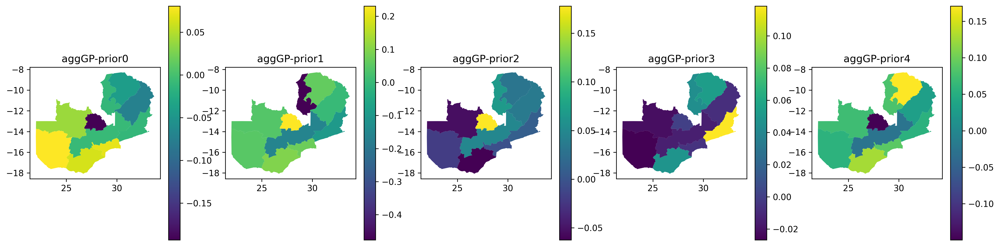

In [109]:
s_new_plot = s[n_old:(n_old + n_new)].copy()

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_new_plot[nm] = agg_gp_draws[i,n_old:(n_old + n_new)]
    s_new_plot.plot(column=nm, ax=axs[i], legend=True)
    axs[i].set_title( 'aggGP-prior' + str(i))

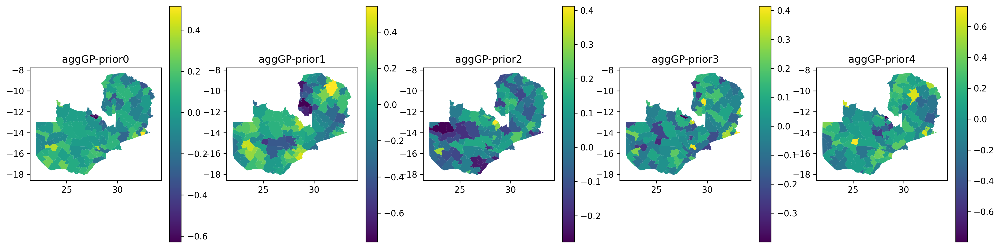

In [110]:
s_old_plot = s[0:n_old].copy()

fig, axs = plt.subplots(1, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_old_plot[nm] = agg_gp_draws[i,0:n_old]
    s_old_plot.plot(column=nm, ax=axs[i], legend=True)
    axs[i].set_title( 'aggGP-prior' + str(i))

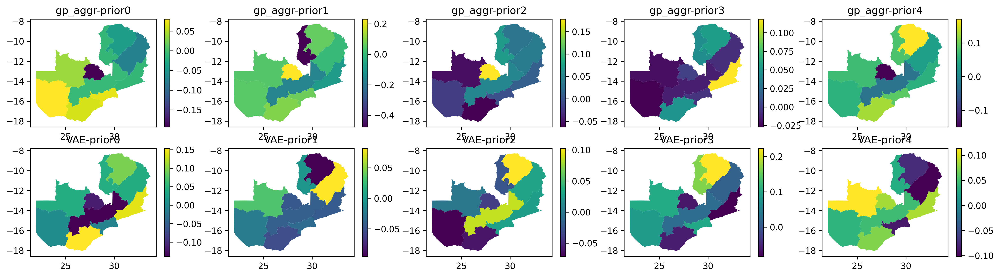

In [111]:
# new
fig, axs = plt.subplots(2, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_new_plot.plot(column=nm, ax=axs[0,i], legend=True)
    axs[0,i].set_title( 'gp_aggr-prior' + str(i))

for i in range(5):
    nm = 'vae_draw_' + str(i)
    s_new_plot[nm] = vae_draws[i,n_old:(n_old + n_new)]
    s_new_plot.plot(column=nm, ax=axs[1,i], legend=True)
    axs[1,i].set_title( 'VAE-prior' + str(i))

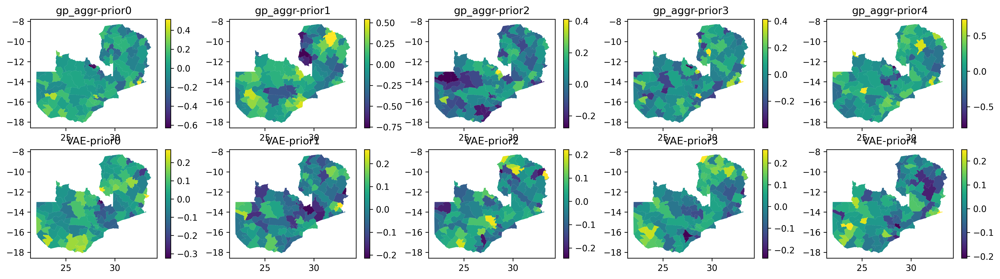

In [112]:
# old
fig, axs = plt.subplots(2, 5, figsize=(20, 5))

for i in range(5):
    nm = 'gp_aggr_' + str(i)
    s_old_plot.plot(column=nm, ax=axs[0,i], legend=True)
    axs[0,i].set_title( 'gp_aggr-prior' + str(i))

for i in range(5):
    nm = 'vae_draw_' + str(i)
    s_old_plot[nm] = vae_draws[i,:n_old]
    s_old_plot.plot(column=nm, ax=axs[1,i], legend=True)
    axs[1,i].set_title( 'VAE-prior' + str(i))

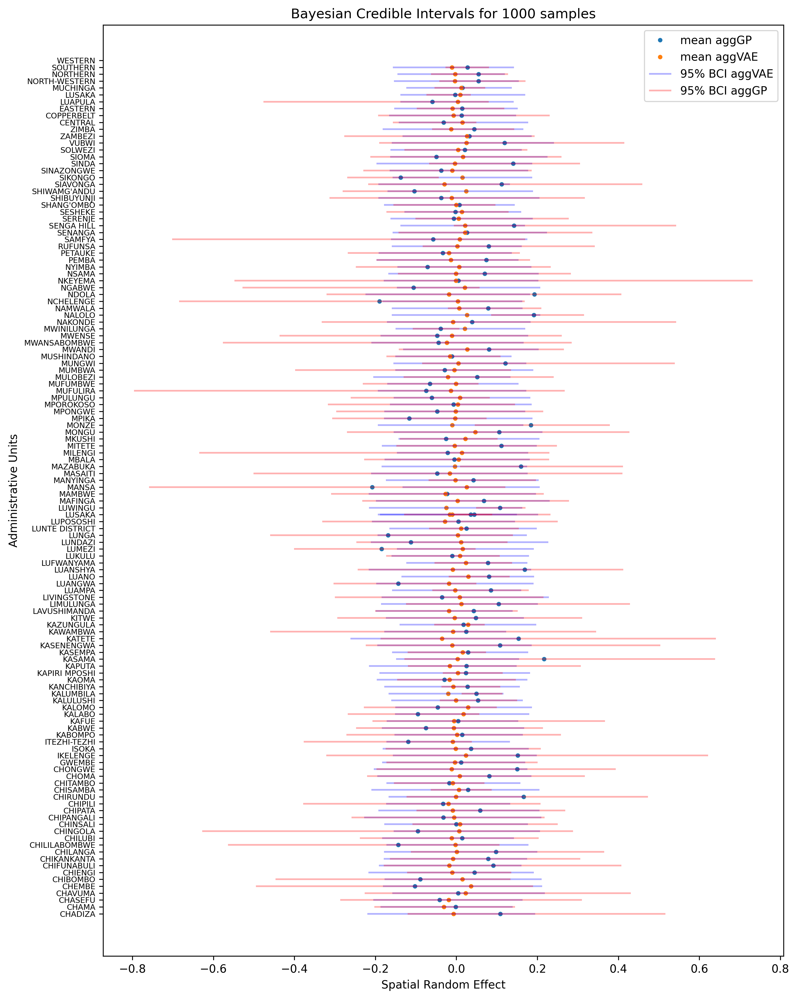

In [113]:
mean_vae_draws = jnp.mean(vae_draws, axis=0)
hpdi_vae_draws = hpdi(vae_draws, 0.95)
mean_gp_aggr = jnp.mean(agg_gp_draws, axis=0)
hpdi_gp_aggr = hpdi(agg_gp_draws,  0.95)

x = np.arange(0, s.shape[0], 1)

# Sort values for plotting by x axis
idx = jnp.argsort(x)
x_axis = s['area']

mean_vae = mean_vae_draws[idx]
mean_gp = mean_gp_aggr[idx]

hpdi_vae = hpdi_vae_draws[:, idx]
hpdi_gp = hpdi_gp_aggr[:, idx]

# Calculate reasonable figure height based on the number of administrative units
fig_height = max(len(x_axis) * 0.1, 8)  # Adjust 0.4 as needed to fit the labels comfortably


# Plot with flipped axes
plt.figure(figsize=(10, fig_height))  # Increase the height of the figure
plt.plot(mean_gp, x_axis, ".", label="mean aggGP")
plt.plot(mean_vae, x_axis, ".", label="mean aggVAE") 
plt.hlines(x_axis, xmin=hpdi_vae[0], xmax=hpdi_vae[1], colors="blue", alpha=0.3, label="95% BCI aggVAE")  # Flipped axes
plt.hlines(x_axis, xmin=hpdi_gp[0], xmax=hpdi_gp[1], colors="red", alpha=0.3, label="95% BCI aggGP")              # Flipped axes
plt.legend()
plt.xlabel('Spatial Random Effect')
plt.ylabel('Administrative Units')
plt.title(f'Bayesian Credible Intervals for {args["num_samples_posterior"]} samples')

# Adjust y-axis ticks and label spacing
plt.yticks(np.arange(len(x_axis)), x_axis, fontsize=7)  # Customize fontsize and spacing

# Save plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.tight_layout()
plt.savefig('figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+model_specs+'_BCI_intervals_priors_after_training.pdf')
plt.show()

In [114]:
(x_coords[1] - x_coords[0]) * (y_coords[40] - y_coords[39])

0.10073260073260057

In [115]:
mean_vae_draws = jnp.mean(vae_draws, axis=0)
hpdi_vae_draws = hpdi(vae_draws, 0.95)
mean_gp_aggr = jnp.mean(agg_gp_draws, axis=0)
hpdi_gp_aggr = hpdi(agg_gp_draws,  0.95)


In [116]:
hpdi_gp_aggr_admin2 = hpdi_gp_aggr[:, :n_old]

In [117]:
hpdi_gp_aggr_admin2

array([[-0.1203196 , -0.2027956 , -0.28661126, -0.22666268, -0.49484643,
        -0.44635168, -0.12153821, -0.17912392, -0.16428344, -0.11236336,
        -0.5636234 , -0.2382719 , -0.6277853 , -0.10821201, -0.2588244 ,
        -0.09818815, -0.37836358, -0.12261988, -0.0634082 , -0.15405607,
        -0.22028685, -0.19748741, -0.1729386 , -0.3209317 , -0.17455418,
        -0.37690955, -0.27157372, -0.2478609 , -0.20701782, -0.26783285,
        -0.22808032, -0.04076973,  0.01315359, -0.03659802, -0.14644246,
        -0.03328019, -0.11959212, -0.1282777 , -0.12055937, -0.22379835,
        -0.18748026, -0.45967904, -0.0546737 , -0.29403898, -0.20036419,
        -0.12412963, -0.2997662 , -0.05905054, -0.30318782, -0.01893086,
        -0.24329768, -0.05404452, -0.17347936, -0.40050936, -0.24690783,
        -0.4598518 , -0.06692675, -0.33091235, -0.12870437,  0.04880608,
        -0.23235022, -0.3090493 , -0.7588455 , -0.06861069, -0.5006148 ,
         0.00911396, -0.2276839 , -0.6345601 , -0.1

In [118]:
np.shape(vae_draws)

(1000, 125)

In [119]:
np.shape(mean_vae_draws)

(125,)

In [120]:
np.shape(hpdi_vae_draws)

(2, 125)

In [121]:
rng_key, rng_key_ = random.split(random.PRNGKey(4))

agg_gp_predictive = Predictive(gp_aggr, num_samples=100)
agg_gp_preds = agg_gp_predictive(rng_key_, args)
agg_gp_draws = agg_gp_preds['gp_aggr']

vae_predictive = Predictive(vae_sample, num_samples=100)
vae_draws = vae_predictive(rng_key_predict, args)['vae_aggr']

m_vae = np.cov(np.transpose(vae_draws))
m_gp = np.cov(np.transpose(agg_gp_draws))

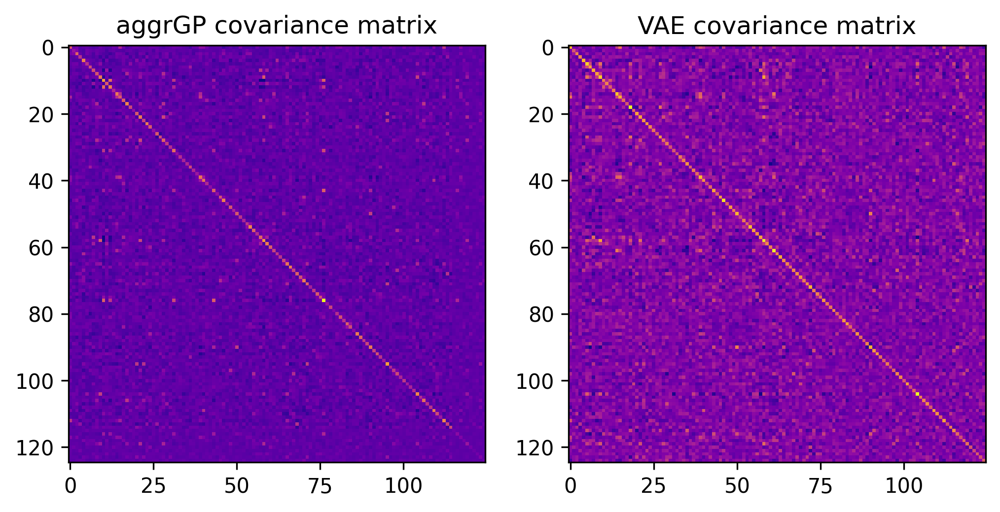

In [122]:
cmap_choice = 'plasma'

#'plasma'
#'inferno'
fig, axs = plt.subplots(nrows=1, ncols=2, figsize = (8,4))
axs[0].imshow(m_gp, cmap=cmap_choice)
#axs[0].axis('off')
axs[0].set_title('aggrGP covariance matrix')

axs[1].imshow(m_vae, cmap=cmap_choice)
#axs[1].axis('off')
axs[1].set_title('VAE covariance matrix')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f"figures/ZMB2018_all_admin_1dcovmat_epo{args['num_epochs']}_grid{n_x}.pdf")

## Prevalence model - VAE

In [123]:
def prev_model_vae_aggr(args, y=None):

    n_obs = args['n_obs']
    x = args["x"]

    # random effect
    decoder_params = args["decoder_params"]
    z_dim, hidden_dim = decoder_params[0][0].shape
    z = numpyro.sample("z", dist.Normal(jnp.zeros(z_dim), jnp.ones(z_dim)))
    decoder_nn = vae_decoder( hidden_dim, N)
    vae_aggr = numpyro.deterministic("vae_aggr", decoder_nn[1](decoder_params, z))
    s = numpyro.sample("sigma", dist.HalfNormal(50))
    vae = numpyro.deterministic('vae', s * vae_aggr)

    # fixed effects
    b0 = numpyro.sample('b0', dist.Normal(0, 1))
    lp = b0 + jnp.multiply(vae, jnp.concatenate([pol_sums_old, pol_sums_new]))
    theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

    numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

In [124]:
run_mcmc = True

if run_mcmc:

    rng_key, rng_key_predict = random.split(random.PRNGKey(6))

    # inference
    start = time.time()
    kernel = NUTS(prev_model_vae_aggr)
    mcmc_vae = MCMC(kernel, num_warmup=args['num_warmup'], num_samples=args["num_mcmc_samples"], num_chains=4)
    mcmc_vae.run(rng_key, args, y = jnp.array(s.y))
    t_elapsed = time.time() - start

    prev_samples = mcmc_vae.get_samples()
    mcmc_vae.print_summary(exclude_deterministic=False)

    print("\nMCMC elapsed time:", round(t_elapsed), "s")

    ss = numpyro.diagnostics.summary(mcmc_vae.get_samples(group_by_chain=True))
    r = np.mean(ss['vae_aggr']['n_eff'])
    print("Average ESS for all aggVAE effects : " + str(round(r)))

    ss = numpyro.diagnostics.summary(mcmc_vae.get_samples(group_by_chain=True))

    ess_old = np.mean(ss['vae_aggr']['n_eff'][0:n_old])
    r_hat_old = np.max(ss['vae_aggr']['r_hat'][0:n_old])

    ess_new = np.mean(ss['vae_aggr']['n_eff'][n_old:(n_old+n_new)])
    r_hat_new = np.max(ss['vae_aggr']['r_hat'][n_old:(n_old+n_new)])

    print("Average ESS for all aggVAE-old effects : " + str(round(ess_old)))
    print("Max r_hat for all aggVAE-old effects : " + str(round(r_hat_old,2)))

    print("Average ESS for all aggVAE-new effects : " + str(round(ess_new)))
    print("Max r_hat for all aggVAE-new effects : " + str(round(r_hat_new,2)))

    print("\nMCMC elapsed time:", round(t_elapsed), "s")
    ss = numpyro.diagnostics.summary(mcmc_vae.get_samples(group_by_chain=True))
    r = np.mean(ss['vae_aggr']['n_eff'])
    print("Average ESS for all VAE-CAR effects : " + str(round(r)))

/tmp/ipykernel_443895/820781222.py:10: UserWarning: There are not enough devices to run parallel chains: expected 4 but got 1. Chains will be drawn sequentially. If you are running MCMC in CPU, consider using `numpyro.set_host_device_count(4)` at the beginning of your program. You can double-check how many devices are available in your system using `jax.local_device_count()`.
  mcmc_vae = MCMC(kernel, num_warmup=args['num_warmup'], num_samples=args["num_mcmc_samples"], num_chains=4)
sample: 100%|█| 1700/1700 [07:51<00:00,  3.61it/s, 1023 steps of size 5.92e-03. 
sample: 100%|█| 1700/1700 [08:04<00:00,  3.51it/s, 1023 steps of size 5.31e-03. 
sample: 100%|█| 1700/1700 [08:04<00:00,  3.51it/s, 1023 steps of size 5.41e-03. 
sample: 100%|█| 1700/1700 [08:08<00:00,  3.48it/s, 1023 steps of size 5.47e-03. 



                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           b0     -2.63      0.07     -2.63     -2.74     -2.52   8613.90      1.00
        sigma      0.94      0.11      0.94      0.77      1.12   1870.23      1.00
     theta[0]      0.07      0.02      0.07      0.04      0.11   8364.69      1.00
     theta[1]      0.06      0.01      0.06      0.04      0.08   6216.69      1.00
     theta[2]      0.04      0.01      0.04      0.02      0.06   6647.28      1.00
     theta[3]      0.10      0.03      0.10      0.05      0.15   8129.22      1.00
     theta[4]      0.05      0.02      0.05      0.02      0.09   7423.28      1.00
     theta[5]      0.05      0.01      0.05      0.03      0.07   6695.74      1.00
     theta[6]      0.04      0.01      0.03      0.02      0.05   6817.92      1.00
     theta[7]      0.04      0.01      0.04      0.02      0.06   6478.63      1.00
     theta[8]      0.16      0.04      0.15      0.09      0.22   6837.81  

Average ESS for all aggVAE effects : 6976
Average ESS for all aggVAE-old effects : 7133
Max r_hat for all aggVAE-old effects : 1.0
Average ESS for all aggVAE-new effects : 5162
Max r_hat for all aggVAE-new effects : 1.0

MCMC elapsed time: 1932 s
Average ESS for all VAE-CAR effects : 6976


In [125]:
# save MCMC
import dill
with open(f"MCMCs/ZMB2018_aggVAE"+ model_specs + "mcmc", 'wb') as file:
   dill.dump(mcmc_vae, file)

In [126]:
# load MCMC

with open(f"MCMCs/ZMB2018_aggVAE"+ model_specs + "mcmc", 'rb') as file:
   mcmc_vae = dill.load(file)

In [127]:
# Text content
content = (
    f"MCMC elapsed time: {round(t_elapsed)} s\n"
    f"Average ESS for all aggVAE effects: {round(r)}\n"
    f"Average ESS for all aggVAE-old effects: {round(ess_old)}\n"
    f"Max r_hat for all aggVAE-old effects: {round(r_hat_old, 2)}\n"
    f"Average ESS for all aggVAE-new effects: {round(ess_new)}\n"
    f"Max r_hat for all aggVAE-new effects: {round(r_hat_new, 2)}\n"
    f"MCMC elapsed time: {round(t_elapsed)} s\n"
    f"Average ESS for all VAE-CAR effects: {round(r)}\n"
)

# LaTeX table content
latex_content = r"""
\begin{table}[h!]
\centering
\begin{tabular}{|c|c|}
\hline
\textbf{Metric} & \textbf{Value} \\
\hline
MCMC elapsed time (s) & """ + f"{round(t_elapsed)}" + r""" \\
\hline
Average ESS for all aggVAE effects & """ + f"{round(r)}" + r""" \\
\hline
Average ESS for all aggVAE-old effects & """ + f"{round(ess_old)}" + r""" \\
\hline
Max r\_hat for all aggVAE-old effects & """ + f"{round(r_hat_old, 2)}" + r""" \\
\hline
Average ESS for all aggVAE-new effects & """ + f"{round(ess_new)}" + r""" \\
\hline
Max r\_hat for all aggVAE-new effects & """ + f"{round(r_hat_new, 2)}" + r""" \\
\hline
MCMC elapsed time (s) & """ + f"{round(t_elapsed)}" + r""" \\
\hline
Average ESS for all VAE-CAR effects & """ + f"{round(r)}" + r""" \\
\hline
\end{tabular}
\caption{Summary of MCMC Results}
\label{table:mcmc_summary}
\end{table}
"""

# Save the text content to a pickle file
text_file_name = f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE' + model_specs + '_mcmc_summary_text.pkl'
with open(text_file_name, 'wb') as text_file:
    pickle.dump(content, text_file)

# Save the LaTeX content to a separate pickle file
latex_file_name = f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE' + model_specs + '_mcmc_summary_latex.pkl'
with open(latex_file_name, 'wb') as latex_file:
    pickle.dump(latex_content, latex_file)

print(f"Text content has been saved to {text_file_name}")
print(f"LaTeX content has been saved to {latex_file_name}")

# To load the text content back from the pickle file (for verification)
with open(text_file_name, 'rb') as text_file:
    loaded_text_content = pickle.load(text_file)
    print("Loaded text content:")
    print(loaded_text_content)

# To load the LaTeX content back from the pickle file (for verification)
with open(latex_file_name, 'rb') as latex_file:
    loaded_latex_content = pickle.load(latex_file)
    print("Loaded LaTeX content:")
    print(loaded_latex_content)
    
# Save the LaTeX content to a .tex file
tex_file_name = f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE' + model_specs + '_mcmc_summary_latex.tex'
with open(tex_file_name, 'w') as tex_file:
    tex_file.write(latex_content)
print(f"LaTeX table has been saved to {tex_file_name}")

# Load and verify the LaTeX table from the .tex file
with open(tex_file_name, 'r') as tex_file:
    latex_from_tex_file = tex_file.read()
    print("\nLoaded from .tex file:")
    print(latex_from_tex_file)

Text content has been saved to figures/ZMB2018_aggVAE_all_admin_mcmcsamp1500_h1024_z512_epochs50_lsGamma(3, 10)_varGamma(8, 100)/ZMB2018_aggVAE_all_admin_mcmcsamp1500_h1024_z512_epochs50_lsGamma(3, 10)_varGamma(8, 100)_mcmc_summary_text.pkl
LaTeX content has been saved to figures/ZMB2018_aggVAE_all_admin_mcmcsamp1500_h1024_z512_epochs50_lsGamma(3, 10)_varGamma(8, 100)/ZMB2018_aggVAE_all_admin_mcmcsamp1500_h1024_z512_epochs50_lsGamma(3, 10)_varGamma(8, 100)_mcmc_summary_latex.pkl
Loaded text content:
MCMC elapsed time: 1932 s
Average ESS for all aggVAE effects: 6976
Average ESS for all aggVAE-old effects: 7133
Max r_hat for all aggVAE-old effects: 1.0
Average ESS for all aggVAE-new effects: 5162
Max r_hat for all aggVAE-new effects: 1.0
MCMC elapsed time: 1932 s
Average ESS for all VAE-CAR effects: 6976

Loaded LaTeX content:

\begin{table}[h!]
\centering
\begin{tabular}{|c|c|}
\hline
\textbf{Metric} & \textbf{Value} \\
\hline
MCMC elapsed time (s) & 1932 \\
\hline
Average ESS for all a

In [128]:
# posterior predictive - 1
prev_posterior_predictive_vae = Predictive(prev_model_vae_aggr, prev_samples)(random.PRNGKey(1), args)

theta_samps_vae_aggr = prev_posterior_predictive_vae['theta']
theta_mean_vae_aggr = theta_samps_vae_aggr.mean(axis=0)
bci_vae_aggr_025 = np.quantile(theta_samps_vae_aggr, 0.025, axis=0)
bci_vae_aggr_975 = np.quantile(theta_samps_vae_aggr, 0.975, axis=0)

s['theta_vae_aggr'] = theta_mean_vae_aggr

theta_observed = s['estimate']
theta_estimated_vae_aggr = s['theta_vae_aggr']

_max = np.max([theta_observed, theta_estimated_vae_aggr])
_min = np.min([theta_observed, theta_estimated_vae_aggr])

In [129]:
s

,area,geometry,new,usage,n_obs,y,estimate,theta_vae_aggr
0,CHADIZA,"POLYGON ((32.57804 -13.93448, 32.75563 -13.982...",0,0.592593,44,2,0.054054,0.073983
1,CHAMA,"POLYGON ((32.84411 -10.34120, 32.84790 -10.341...",0,0.656690,220,13,0.059658,0.059316
2,CHASEFU,"POLYGON ((32.94614 -12.21183, 32.94578 -12.211...",0,0.491268,157,3,0.018292,0.040508
3,CHAVUMA,"POLYGON ((21.99573 -13.46393, 21.99610 -13.439...",0,0.438596,56,5,0.089286,0.097897
4,CHEMBE,"POLYGON ((28.89259 -11.50817, 28.87754 -11.520...",0,0.826087,51,0,0.000000,0.054841
...,...,...,...,...,...,...,...,...
5,MUCHINGA,"POLYGON ((32.16182 -9.05766, 32.19187 -9.09042...",1,0.570684,1436,68,0.047068,0.047315
6,NORTH-WESTERN,"POLYGON ((24.15075 -11.02947, 24.15078 -11.029...",1,0.482494,1291,61,0.046977,0.047312
7,NORTHERN,"POLYGON ((30.48184 -8.28098, 30.48544 -8.28408...",1,0.592238,1992,108,0.054141,0.054073
8,SOUTHERN,"POLYGON ((27.61591 -15.52350, 27.61987 -15.524...",1,0.429838,2851,346,0.121329,0.121360


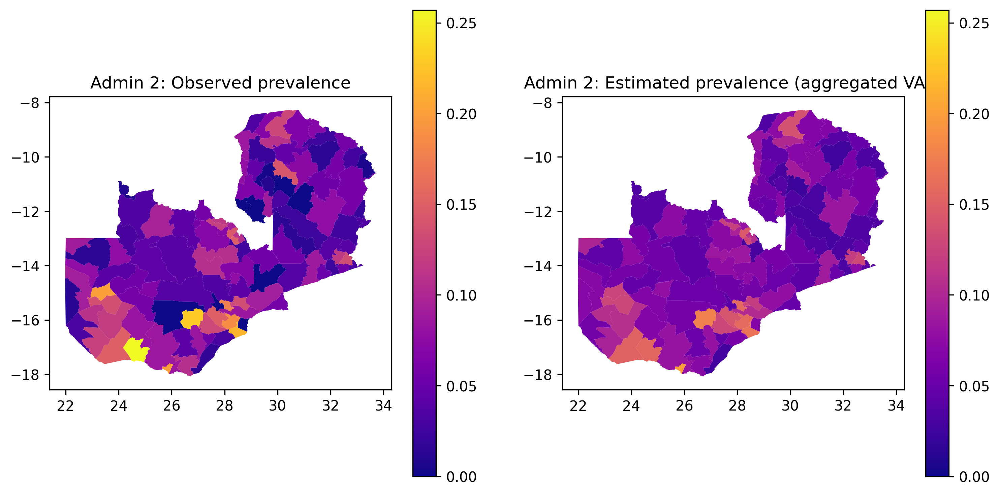

In [130]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

s[0:n_old].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[0:n_old].plot(column="theta_vae_aggr", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

ax[0].set_title( 'Admin 2: Observed prevalence')
ax[1].set_title( 'Admin 2: Estimated prevalence (aggregated VAE)')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+ model_specs + '_prev_results_admin2.pdf')

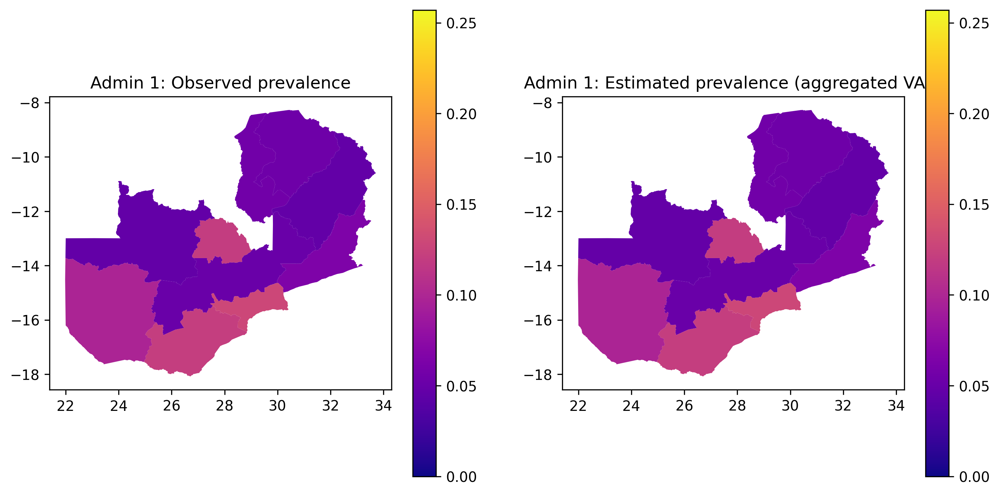

In [131]:
fig, ax = plt.subplots(1, 2, figsize=(12,6))

s[n_old:(n_old + n_new)].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[n_old:(n_old + n_new)].plot(column="theta_vae_aggr", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)

ax[0].set_title( 'Admin 1: Observed prevalence')
ax[1].set_title( 'Admin 1: Estimated prevalence (aggregated VAE)')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+ model_specs + '_prev_results_admin1.pdf')

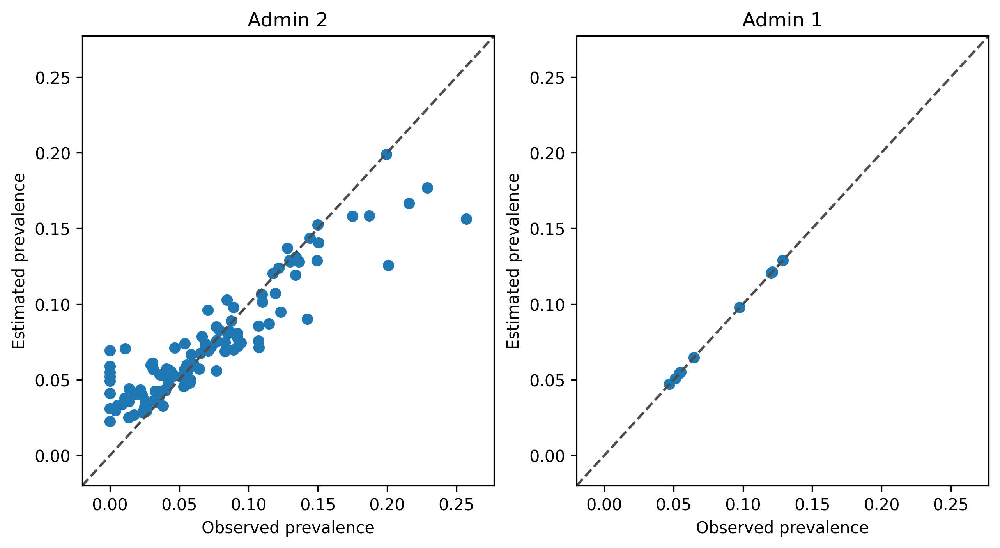

In [132]:
fig, ax = plt.subplots(1, 2, figsize=(10,5))

ax[0].scatter(s[0:n_old].estimate, s[0:n_old].theta_vae_aggr)
ax[0].set_ylim(_min-0.02, _max+0.02)
ax[0].set_xlim(_min-0.02, _max+0.02)
ax[0].axline((1, 1), slope=1, ls="--", c=".3")
ax[0].set_xlabel("Observed prevalence")
ax[0].set_ylabel("Estimated prevalence")
ax[0].set_title("Admin 2")

ax[1].scatter(s[n_old:(n_old + n_new)].estimate, s[n_old:(n_old + n_new)].theta_vae_aggr)
ax[1].set_ylim(_min-0.02, _max+0.02)
ax[1].set_xlim(_min-0.02, _max+0.02)
ax[1].axline((1, 1), slope=1, ls="--", c=".3")
ax[1].set_xlabel("Observed prevalence")
ax[1].set_ylabel("Estimated prevalence")
ax[1].set_title("Admin 1")

#plt.rcParams['figure.dpi'] = 300
#plt.rcParams['savefig.dpi'] = 300
#plt.savefig('res/est_obs_vae.pdf')

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.savefig(f'figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+ model_specs + '_prev_results_scatterplot.pdf')

In [133]:
# Example observations and predictions
observations = s.estimate
predictions = s.theta_vae_aggr


def save_accuracy_metrics(observations, predictions, model_specs_dir, model_specs_file):

    # Pearson correlation coefficient
    pearson_corr, _ = pearsonr(observations, predictions)
    print(f'Pearson correlation coefficient: {pearson_corr:.4f}')

    # Spearman correlation coefficient
    spearman_corr, _ = spearmanr(observations, predictions)
    print(f'Spearman correlation coefficient: {spearman_corr:.4f}')

    # Root Mean Squared Error (RMSE)
    rmse = np.sqrt(mean_squared_error(observations, predictions))
    print(f'Root Mean Squared Error (RMSE): {rmse:.4f}')

    # Mean Absolute Error (MAE)
    mae = mean_absolute_error(observations, predictions)
    print(f'Mean Absolute Error (MAE): {mae:.4f}')

    # Save results to a text file
    with open(f'figures/ZMB2018_aggVAE'+model_specs_dir+'/ZMB2018_aggVAE' + model_specs_file + '_prev_metrics.txt', 'w') as file:
        file.write(f'Pearson correlation coefficient: {pearson_corr:.4f}\n')
        file.write(f'Spearman correlation coefficient: {spearman_corr:.4f}\n')
        file.write(f'Root Mean Squared Error (RMSE): {rmse:.4f}\n')
        file.write(f'Mean Absolute Error (MAE): {mae:.4f}\n')

    # Generate LaTeX table
    latex_table = f"""
    \\documentclass{{article}}
    \\usepackage{{booktabs}}

    \\begin{{document}}

    \\begin{{table}}[h!]
    \\centering
    \\begin{{tabular}}{{ll}}
    \\toprule
    Metric & Value \\\\
    \\midrule
    Pearson correlation coefficient & {pearson_corr:.4f} \\\\
    Spearman correlation coefficient & {spearman_corr:.4f} \\\\
    Root Mean Squared Error (RMSE) & {rmse:.4f} \\\\
    Mean Absolute Error (MAE) & {mae:.4f} \\\\
    \\bottomrule
    \\end{{tabular}}
    \\caption{{Performance Metrics}}
    \\label{{tab:metrics}}
    \\end{{table}}

    \\end{{document}}
    """

    latex_file = f'figures/ZMB2018_aggVAE'+model_specs_dir+'/ZMB2018_aggVAE' + model_specs_file + '_latex_metrics.tex'
    # Save LaTeX table to a .tex file
    with open(latex_file, 'w') as file:
        file.write(latex_table)


    # Save metrics to a pickle file
    pickle_file = f'figures/ZMB2018_aggVAE'+model_specs_dir+'/ZMB2018_aggVAE' + model_specs_file + '_prev_metrics.pkl'
    metrics = {
        'pearson_corr': pearson_corr,
        'spearman_corr': spearman_corr,
        'rmse': rmse,
        'mae': mae
    }
    with open(pickle_file, 'wb') as file:
        pickle.dump(metrics, file)

    # Load and verify the LaTeX table
    with open(latex_file, 'r') as file:
        latex_data = file.read()
        print("\nLoaded from LaTeX file:")
        print(latex_data)

    # Load and verify the pickle file results
    with open(pickle_file, 'rb') as file:
        loaded_metrics = pickle.load(file)
        print("\nLoaded from pickle file:")
        print(loaded_metrics)

    # Check if loaded metrics match the original metrics
    assert np.isclose(loaded_metrics['pearson_corr'], pearson_corr), "Pearson correlation coefficient does not match."
    assert np.isclose(loaded_metrics['spearman_corr'], spearman_corr), "Spearman correlation coefficient does not match."
    assert np.isclose(loaded_metrics['rmse'], rmse), "RMSE does not match."
    assert np.isclose(loaded_metrics['mae'], mae), "MAE does not match."

    print("All metrics loaded correctly from the pickle file.")
    
    return latex_data

all_admin_metric_latex_table = save_accuracy_metrics(observations, predictions, model_specs, model_specs)

all_admin_metric_latex_table

Pearson correlation coefficient: 0.9203
Spearman correlation coefficient: 0.9004
Root Mean Squared Error (RMSE): 0.0234
Mean Absolute Error (MAE): 0.0152

Loaded from LaTeX file:

    \documentclass{article}
    \usepackage{booktabs}

    \begin{document}

    \begin{table}[h!]
    \centering
    \begin{tabular}{ll}
    \toprule
    Metric & Value \\
    \midrule
    Pearson correlation coefficient & 0.9203 \\
    Spearman correlation coefficient & 0.9004 \\
    Root Mean Squared Error (RMSE) & 0.0234 \\
    Mean Absolute Error (MAE) & 0.0152 \\
    \bottomrule
    \end{tabular}
    \caption{Performance Metrics}
    \label{tab:metrics}
    \end{table}

    \end{document}
    

Loaded from pickle file:
{'pearson_corr': 0.9202931557430928, 'spearman_corr': 0.9003711767417925, 'rmse': 0.023384930437328685, 'mae': 0.01522338000167788}
All metrics loaded correctly from the pickle file.


'\n    \\documentclass{article}\n    \\usepackage{booktabs}\n\n    \\begin{document}\n\n    \\begin{table}[h!]\n    \\centering\n    \\begin{tabular}{ll}\n    \\toprule\n    Metric & Value \\\\\n    \\midrule\n    Pearson correlation coefficient & 0.9203 \\\\\n    Spearman correlation coefficient & 0.9004 \\\\\n    Root Mean Squared Error (RMSE) & 0.0234 \\\\\n    Mean Absolute Error (MAE) & 0.0152 \\\\\n    \\bottomrule\n    \\end{tabular}\n    \\caption{Performance Metrics}\n    \\label{tab:metrics}\n    \\end{table}\n\n    \\end{document}\n    '

In [134]:
s_old_metric = s[0:n_old].copy()
s_new_metric = s[n_old:(n_old + n_new)].copy()

obs_old = s_old_metric.estimate
obs_new = s_new_metric.estimate

pred_old = s_old_metric.theta_vae_aggr
pred_new = s_new_metric.theta_vae_aggr

model_specs_old = model_specs + "_admin2"
model_specs_new = model_specs + "_admin1"

In [135]:
save_accuracy_metrics(obs_old, pred_old, model_specs, model_specs_old)

Pearson correlation coefficient: 0.9192
Spearman correlation coefficient: 0.8960
Root Mean Squared Error (RMSE): 0.0244
Mean Absolute Error (MAE): 0.0165

Loaded from LaTeX file:

    \documentclass{article}
    \usepackage{booktabs}

    \begin{document}

    \begin{table}[h!]
    \centering
    \begin{tabular}{ll}
    \toprule
    Metric & Value \\
    \midrule
    Pearson correlation coefficient & 0.9192 \\
    Spearman correlation coefficient & 0.8960 \\
    Root Mean Squared Error (RMSE) & 0.0244 \\
    Mean Absolute Error (MAE) & 0.0165 \\
    \bottomrule
    \end{tabular}
    \caption{Performance Metrics}
    \label{tab:metrics}
    \end{table}

    \end{document}
    

Loaded from pickle file:
{'pearson_corr': 0.9191779996825742, 'spearman_corr': 0.8959703064436985, 'rmse': 0.02438041028764348, 'mae': 0.016534507359506855}
All metrics loaded correctly from the pickle file.


'\n    \\documentclass{article}\n    \\usepackage{booktabs}\n\n    \\begin{document}\n\n    \\begin{table}[h!]\n    \\centering\n    \\begin{tabular}{ll}\n    \\toprule\n    Metric & Value \\\\\n    \\midrule\n    Pearson correlation coefficient & 0.9192 \\\\\n    Spearman correlation coefficient & 0.8960 \\\\\n    Root Mean Squared Error (RMSE) & 0.0244 \\\\\n    Mean Absolute Error (MAE) & 0.0165 \\\\\n    \\bottomrule\n    \\end{tabular}\n    \\caption{Performance Metrics}\n    \\label{tab:metrics}\n    \\end{table}\n\n    \\end{document}\n    '

In [136]:
save_accuracy_metrics(obs_new, pred_new, model_specs, model_specs_new)

Pearson correlation coefficient: 1.0000
Spearman correlation coefficient: 1.0000
Root Mean Squared Error (RMSE): 0.0002
Mean Absolute Error (MAE): 0.0001

Loaded from LaTeX file:

    \documentclass{article}
    \usepackage{booktabs}

    \begin{document}

    \begin{table}[h!]
    \centering
    \begin{tabular}{ll}
    \toprule
    Metric & Value \\
    \midrule
    Pearson correlation coefficient & 1.0000 \\
    Spearman correlation coefficient & 1.0000 \\
    Root Mean Squared Error (RMSE) & 0.0002 \\
    Mean Absolute Error (MAE) & 0.0001 \\
    \bottomrule
    \end{tabular}
    \caption{Performance Metrics}
    \label{tab:metrics}
    \end{table}

    \end{document}
    

Loaded from pickle file:
{'pearson_corr': 0.9999861490756115, 'spearman_corr': 0.9999999999999999, 'rmse': 0.0001909917660569821, 'mae': 0.00014541538664465808}
All metrics loaded correctly from the pickle file.


'\n    \\documentclass{article}\n    \\usepackage{booktabs}\n\n    \\begin{document}\n\n    \\begin{table}[h!]\n    \\centering\n    \\begin{tabular}{ll}\n    \\toprule\n    Metric & Value \\\\\n    \\midrule\n    Pearson correlation coefficient & 1.0000 \\\\\n    Spearman correlation coefficient & 1.0000 \\\\\n    Root Mean Squared Error (RMSE) & 0.0002 \\\\\n    Mean Absolute Error (MAE) & 0.0001 \\\\\n    \\bottomrule\n    \\end{tabular}\n    \\caption{Performance Metrics}\n    \\label{tab:metrics}\n    \\end{table}\n\n    \\end{document}\n    '

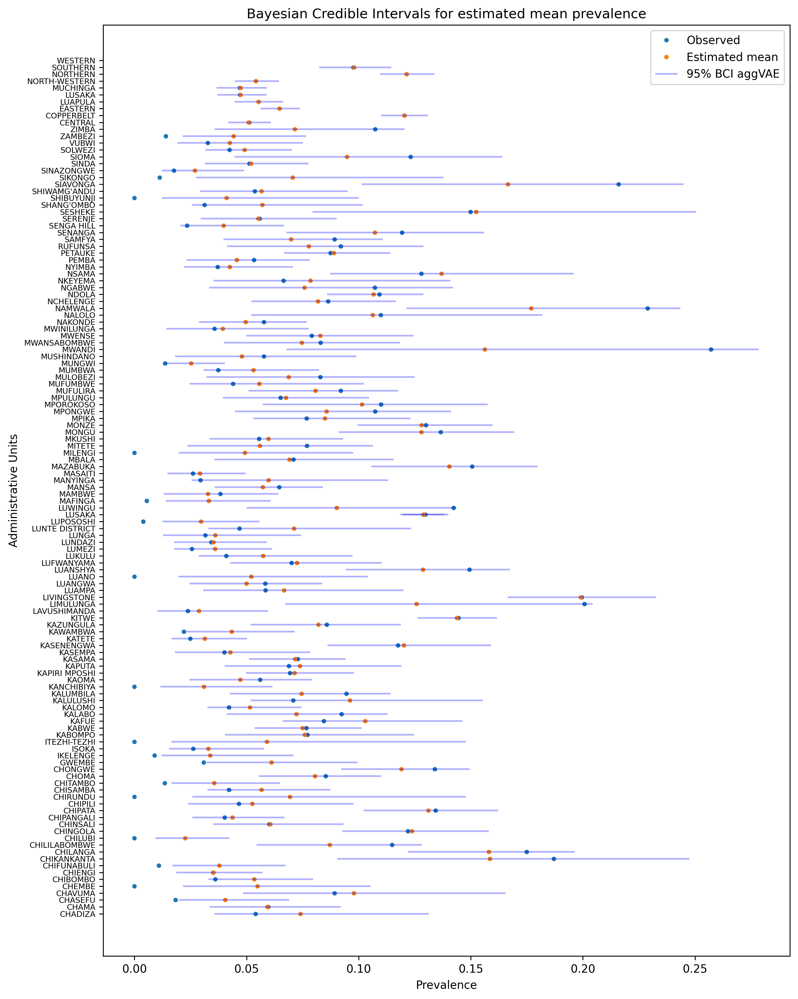

In [137]:
# BCI intervals 

x_axis = s['area']


# Calculate reasonable figure height based on the number of administrative units
fig_height = max(len(x_axis) * 0.1, 8)  # Adjust 0.4 as needed to fit the labels comfortably


# Plot with flipped axes
plt.figure(figsize=(10, fig_height))  # Increase the height of the figure
plt.plot(s["estimate"], x_axis, ".", label="Observed")
plt.plot(theta_mean_vae_aggr, x_axis, ".", label="Estimated mean") 
plt.hlines(x_axis, xmin=bci_vae_aggr_025, xmax=bci_vae_aggr_975, colors="blue", alpha=0.3, label="95% BCI aggVAE")  # Flipped axes           # Flipped axes
plt.legend()
plt.xlabel('Prevalence')
plt.ylabel('Administrative Units')
plt.title(f'Bayesian Credible Intervals for estimated mean prevalence')

# Adjust y-axis ticks and label spacing
plt.yticks(np.arange(len(x_axis)), x_axis, fontsize=7)  # Customize fontsize and spacing

# Save plot
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
plt.tight_layout()
plt.savefig('figures/ZMB2018_aggVAE'+model_specs+'/ZMB2018_aggVAE'+model_specs+'_BCI_intervals_estimated_prev.pdf')
plt.show()

In [138]:
def prev_model_gp_aggr(args, y=None):

    n_obs = args['n_obs']
    x = args["x"]
    gp_kernel=args["gp_kernel"]
    jitter = args["jitter"]
    M_old = args["M_old"]
    M_new = args["M_new"]

    # random effect - aggregated GP
    length = numpyro.sample("kernel_length", dist.InverseGamma(3,3))
    var = numpyro.sample("kernel_var", dist.HalfNormal(0.05))
    k = gp_kernel(x, x, var, length, jitter)
    f = numpyro.sample("f", dist.MultivariateNormal(loc=jnp.zeros(x.shape[0]), covariance_matrix=k))

    # aggregate f into gp_aggr according to indexing of (point in polygon)
    gp_aggr_old = numpyro.deterministic('gp_aggr_old', M_g(M_old, f))
    gp_aggr_new = numpyro.deterministic('gp_aggr_new', M_g(M_new, f))
    gp_aggr = numpyro.deterministic('gp_aggr', jnp.concatenate([gp_aggr_old, gp_aggr_new]))

    # fixed effects
    b0 = numpyro.sample('b0', dist.Normal(0, 1))

    # linear predictor
    lp = b0 + gp_aggr
    theta = numpyro.deterministic("theta", jax.nn.sigmoid(lp))

    numpyro.sample("obs", dist.BinomialLogits(total_count = n_obs, logits=lp), obs=y)

In [139]:
# Load
#with open('MCMCs/prev_model_gp_aggr_joint_500iter_lsIG3_3', 'rb') as file:
#    mcmc_gp_aggr = pickle.load(file)

#prev_samples_aggr = mcmc_gp_aggr.get_samples()
#mcmc_gp_aggr.print_summary(exclude_deterministic=False)

In [140]:
# posterior predictive
prev_posterior_predictive = Predictive(prev_model_gp_aggr, prev_samples_aggr)(random.PRNGKey(1), args)

theta_samps_gp = prev_posterior_predictive['theta']
theta_mean_gp = theta_samps_gp.mean(axis=0)
bci_gp_25 = np.quantile(theta_samps_gp, 0.25, axis=0)
bci_gp_75 = np.quantile(theta_samps_gp, 0.75, axis=0)

s['theta_gp'] = theta_mean_gp
theta_estimated_gp = s['theta_gp']

NameError: name 'prev_samples_aggr' is not defined

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10,5))

ax[0].scatter(s[0:n_old].theta_gp, s[0:n_old].theta_vae_aggr)
ax[0].set_ylim(_min-0.02, _max+0.02)
ax[0].set_xlim(_min-0.02, _max+0.02)
ax[0].axline((1, 1), slope=1, ls="--", c=".3")
ax[0].set_xlabel("estimated prev (aggGP)")
ax[0].set_ylabel("estimated prev (aggVAE)")
ax[0].set_title("before 2010")

ax[1].scatter(s[n_old:(n_old + n_new)].theta_gp, s[n_old:(n_old + n_new)].theta_vae_aggr)
ax[1].set_ylim(_min-0.02, _max+0.02)
ax[1].set_xlim(_min-0.02, _max+0.02)
ax[1].axline((1, 1), slope=1, ls="--", c=".3")
ax[1].set_xlabel("estimated prev (aggGP)")
ax[1].set_ylabel("estimated prev (aggVAE)")
ax[1].set_title("after 2010")

In [ ]:
# 1
_max = np.max([s['estimate'], s['theta_gp'], s['theta_vae_aggr']])
_min = np.min([s['estimate'], s['theta_gp'], s['theta_vae_aggr']])

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18,6))
s[0:n_old].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[0:n_old].plot(column="theta_gp", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[0:n_old].plot(column="theta_vae_aggr", ax=ax[2], legend=True, cmap='plasma', vmin=_min, vmax =_max)
ax[0].set_title( 'Before: Observed prev')
ax[1].set_title( 'Before: Estimated prev (aggGP)')
ax[2].set_title( 'Before: Estimated prev (aggVAE)')

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(18,6))
s[n_old:(n_old+n_new)].plot(column="estimate", ax=ax[0], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[n_old:(n_old+n_new)].plot(column="theta_gp", ax=ax[1], legend=True, cmap='plasma', vmin=_min, vmax =_max)
s[n_old:(n_old+n_new)].plot(column="theta_vae_aggr", ax=ax[2], legend=True, cmap='plasma', vmin=_min, vmax =_max)
ax[0].set_title( 'After: Observed prev')
ax[1].set_title( 'After: Estimated prev (aggGP)')
ax[2].set_title( 'After: Estimated prev (aggVAE)')